In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os
import cv2
import torchvision
import torchvision.transforms as transforms
import numpy as np
import pandas as pd
from PIL import Image
from matplotlib import pyplot as plt
import skimage
from skimage import color, metrics, filters
from skimage.color import rgb2gray
from matplotlib import cm
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
from mpl_toolkits.mplot3d import Axes3D
from datetime import datetime
import pytz
import math

import tensorflow as tf
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Conv2D, UpSampling2D
from tensorflow.keras.utils import img_to_array, load_img
from tensorflow.core.util import event_pb2
from keras.preprocessing.image import ImageDataGenerator


import tensorboard
import warnings
warnings.filterwarnings('ignore')

In [ ]:
# CHANGE THESE!!!
pwd = '/content/drive/MyDrive/COMP3362_Proj/'

In [ ]:
# Parameters (Can change)
categoryTestSize = 3        # How many test data for each label
validation_percent = 0.2

# Constant Variables (Don't change)
data_dir = pwd + 'Datasets/FIDS30'
tz = pytz.timezone('Asia/Hong_Kong')
DIMENSION = (256, 256)
RESAMPLE = 3

# Classes

### Data

In [ ]:
class Data():
  def __init__(self, labelsToInclude=[], testSize=3, includeNoisyBgForTrain=False):
    # Config data
    self.labelsToInclude = labelsToInclude # Empty labels means all data
    self.includeNoisyBgForTrain = includeNoisyBgForTrain

    # Labels
    self.labels = []

    # Training Data
    self.trainingSize = 0
    self.trainImages = []
    self.x_train = None
    self.y_train = None

    # Test Data
    self.testSize = testSize
    self.testImages = dict()
    self.rgb_org_test = dict()
    self.gray_org_test = dict()
    self.lab_org_test = dict()
    self.l_org_test = dict()



  def loadImages(self):
    data_paths = []
    self.trainImages = []
    self.labels = []
    self.testImages = dict()

    ###################################
    ######### Load Data Paths #########
    ###################################
    print('Loading image paths...')
    print('')

    # Get data paths
    for dirname, _, filenames in os.walk(data_dir):
      for filename in filenames:
        file_path = os.path.join(dirname, filename)

        label = file_path.split('/')[-2]

        if (len(self.labelsToInclude) == 0 or label in self.labelsToInclude or label == 'mixed'):
          # Check if it is "background" image (meaning it contains noisy background)
          if ('background' in filename):
            label += '_background'


          data_paths.append((file_path, label))

    data_size = len(data_paths)

    print('Data paths loaded!')
    print('     Number of data:', data_size)
    print('')

    ###################################
    ########### Load Images ###########
    ###################################
    print('Loading images from paths...')
    print('')

    # Load and resize image
    for data_path, label in data_paths:
      image = np.asarray(Image.open(data_path))
      
      # Expand if only 2 in dimensions
      if (image.ndim==2):
        image = np.tile(image[:,:,None],3)
      
      # remove CMYK or RGBA image representation
      if (np.asarray(image).shape[2] != 3):
        continue
      
      # Resize Image
      image = Image.fromarray(image).resize(DIMENSION, resample=RESAMPLE)


      if (self.includeNoisyBgForTrain):
        if (label not in self.testImages):
          self.testImages[label] = [np.asarray(image)]
        elif (label == 'mixed' or len(self.testImages[label]) < self.testSize):
          self.testImages[label].append(np.asarray(image))
        else:
          self.trainImages.append(np.asarray(image))
      else:
        if (label not in self.testImages):
          self.testImages[label] = [np.asarray(image)]
        elif (label == 'mixed' or 'background' in label or len(self.testImages[label]) < self.testSize):
          self.testImages[label].append(np.asarray(image))
        else:
          self.trainImages.append(np.asarray(image))

      self.labels.append(label)

    # Convert to np array
    self.trainImages = np.asarray(self.trainImages)
    self.labels = np.asarray(self.labels)
    for label in self.testImages:
      self.testImages[label] = np.asarray(self.testImages[label])
    
    self.trainingSize = self.trainImages.shape[0]

    print('Images Loaded!')
    print('     Shape  of training data:', self.trainImages.shape)
    print('     Number of test data:')
    for label in self.testImages:
      print(f'       {label:10}: {len(self.testImages[label])}')

  
  def dataAugmentation(self, dataset_multiply=10, rotation_range=30, zoom_range=0.3, horizontal_flip=True, width_shift_range=0.0, height_shift_range=0.0, brightness_range=None, shear_range=0.0):
    # Augment data
    train_augmentation = ImageDataGenerator(rotation_range=rotation_range,
                                            zoom_range=zoom_range,
                                            horizontal_flip=horizontal_flip,
                                            width_shift_range=width_shift_range,
                                            height_shift_range=height_shift_range,
                                            brightness_range=brightness_range,
                                            shear_range=shear_range,
                                            rescale=1./255)
    
    augmented_images = train_augmentation.flow(self.trainImages, batch_size=1)

    # Retrieve Augmented data
    trainImagesTemp = []

    i = 0
    for augmented_image in augmented_images:
      image = augmented_image[0]
      trainImagesTemp.append(image)

      i += 1
      if (i >= self.trainingSize * dataset_multiply):
        break

    self.trainImages = np.asarray(trainImagesTemp)
    self.trainingSize = len(self.trainImages)
    print('Augmented data shape:', self.trainImages.shape)
  
  def dataProcessing(self, image):
    # Change to LAB Space
    lab_image = color.rgb2lab(image)

    # Get L Space
    l_image = lab_image[:,:,0]

    # Get AB Space
    ab_image = lab_image[:,:,1:] / 100.

    return l_image, ab_image
  
  def processTrainingData(self):
    l_train = []   # L  of LAB image
    ab_train = []  # AB of LAB image

    for image in self.trainImages:
      l_image, ab_image = self.dataProcessing(image)

      l_train.append(l_image)
      ab_train.append(ab_image)

    # # Convert to np array with correct shape
    l_train = np.asarray(l_train)
    self.x_train = l_train.reshape(l_train.shape[0], l_train.shape[1], l_train.shape[2], 1)
    self.y_train = np.asarray(ab_train)

    print("Training Shape:")
    print("  Training Input  Images in L Space   :", self.x_train.shape)
    print("  Training Output Images in AB Space  :", self.y_train.shape)
    print('')
  
  def processTestData(self):
    self.rgb_org_test = dict()
    self.gray_org_test = dict()
    self.lab_org_test = dict()
    self.l_org_test = dict()

    test_augmentation = ImageDataGenerator(rescale=1./255)

    for label in self.testImages:
      rgb_list = []
      gray_list = []
      lab_list = []
      l_list = []

      test_images_label = test_augmentation.flow(self.testImages[label], batch_size=128, shuffle=False)

      for numBatch in range(len(test_images_label)):
        for image in test_images_label[numBatch]:
          rgb_image = np.asarray(image)
          gray_image = color.rgb2gray(rgb_image)
          lab_image = color.rgb2lab(rgb_image)
          l_image = lab_image[:,:,0]

          rgb_list.append(rgb_image)
          gray_list.append(gray_image)
          lab_list.append(lab_image)
          l_list.append(l_image)
      
      self.rgb_org_test[label] = np.asarray(rgb_list)
      self.gray_org_test[label] = np.asarray(gray_list)
      self.lab_org_test[label] = np.asarray(lab_list)
      
      l_list = np.asarray(l_list)
      l_list = l_list.reshape(l_list.shape[0], l_list.shape[1], l_list.shape[2], 1)
      self.l_org_test[label] = l_list
      
    labelToPrint = self.labels[0] if len(self.labels) > 0 else 'bananas'
    print(f"Testing Shape (category: {labelToPrint}):")
    print("  Resized Test Image in RGB  Space   :", self.rgb_org_test[labelToPrint].shape)
    print("  Resized Test Image in gray Space   :", self.gray_org_test[labelToPrint].shape)
    print("  Resized Test Image in LAB  Space   :", self.lab_org_test[labelToPrint].shape)
    print("  Resized Test Image in L    Space   :", self.l_org_test[labelToPrint].shape)
    print('')

  
  def checkDistribution(self, title):
    image_df = pd.DataFrame(data=self.labels, columns=['Fruit'])

    graph = image_df['Fruit'].value_counts()[:]
    graph.plot(kind='bar',figsize=(10,8))
    plt.xticks(rotation=90, fontsize=14)
    plt.yticks(rotation=0, fontsize=12)
    plt.xlabel('Fruits', fontsize=16)
    plt.ylabel('Distribution', fontsize=16)
    plt.title('title', fontsize=20)
  
  def showImage(self, imageArray, axis='on', grayscale=False):
    if (grayscale):
      plt.imshow(imageArray, cmap='gray', interpolation='nearest')
    else:
      plt.imshow(imageArray, interpolation='nearest')

    plt.axis(axis)
    plt.show()

### Colorization Model

In [ ]:
class ColorizationModel():

  def __init__(self, modelName, modelChoice='modelC', learningRate=0.002, decay=0.9, lossChoice='mse'):
    modelName = datetime.now(tz=tz).strftime("%m-%d %H:%M:%S ") + modelName
    self.modelLogDir = pwd + 'ModelLog (Alex)/' + modelName
    self.trainedModelDir = pwd + 'TrainedModel (Alex)/' + modelName
    self.model = None
    self.history = None
    self.tesnorboard_callback = None

    if (modelChoice == 'modelA'):
      self.model = self.ModelA()
    elif (modelChoice == 'modelB'):
      self.model = self.ModelB()
    elif (modelChoice == 'modelC'):
      self.model = self.ModelC()
    elif (modelChoice == 'modelD'):
      self.model = self.ModelD()
    else:
      print('No Such Model (Not Yet Implemented In Class?)')
      return
    
    if (lossChoice == 'mse'):
      loss = 'mse'
    else:
      print('No Such Loss (Not Yet Implemented In Class?)')

    optimizer= tf.keras.optimizers.Adam(learning_rate=learningRate, decay=decay, clipnorm=1.0)

    self.model.compile(optimizer=optimizer, loss=loss, metrics=['accuracy'])
    self.model.summary()
    self.tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=self.modelLogDir)

    print('')
    print('Model Information:')
    print(f'Model of choice: {modelChoice}')
    print(f'Learning Rate: {learningRate}')
    print(f'Decay: {decay}')
    print(f'Loss Choice: {lossChoice}')
    print('')
    print(f'Model Log Directory     : {self.modelLogDir}')
    print(f'Trained Model Directory : {self.trainedModelDir}')
  
  def train(self, x_train, y_train, epochs, batch_size=128):
    print('Range:')
    print(f'x_train: [{x_train.min()}, {x_train.max()}]')
    print(f'y_train: [{y_train.min()}, {y_train.max()}]')
    self.history = self.model.fit(x=x_train, y=y_train, validation_split=validation_percent, epochs=epochs, batch_size=batch_size, callbacks=[self.tensorboard_callback], shuffle=True)

    self.model.save(self.trainedModelDir)

    print('\nWAIT! Saving Model...')

    print('\nTraining Finished')
    print('   Model Log saved in      :', self.modelLogDir)
    print('   Trained Model saved in  :', self.trainedModelDir)

  def ModelA(self):
    modelA = Sequential([
      # Encoder
      Conv2D(64, (3, 3), activation='relu', padding='same', strides=2, input_shape=(256, 256, 1)),
      Conv2D(128, (3, 3), activation='relu', padding='same'),
      Conv2D(128, (3,3), activation='relu', padding='same', strides=2),
      Conv2D(256, (3,3), activation='relu', padding='same'),
      Conv2D(256, (3,3), activation='relu', padding='same', strides=2),
      Conv2D(512, (3,3), activation='relu', padding='same'),

      # Decoder
      Conv2D(512, (3,3), activation='relu', padding='same'),
      Conv2D(256, (3,3), activation='relu', padding='same'),
      Conv2D(128, (3,3), activation='relu', padding='same'),
      UpSampling2D((2, 2)),
      Conv2D(64, (3,3), activation='relu', padding='same'),
      UpSampling2D((2, 2)),
      Conv2D(32, (3,3), activation='relu', padding='same'),
      Conv2D(16, (3,3), activation='relu', padding='same'),
      Conv2D(2, (3, 3), activation='relu', padding='same'),
      UpSampling2D((2, 2))
    ])
    return modelA
  
  def ModelB(self):
    modelB = Sequential([
      # Encoder
      Conv2D(64, (3, 3), activation='relu', padding='same', strides=2, input_shape=(256, 256, 1)),
      Conv2D(128, (3, 3), activation='relu', padding='same'),
      Conv2D(128, (3,3), activation='relu', padding='same', strides=2),
      Conv2D(256, (3,3), activation='relu', padding='same'),
      Conv2D(256, (3,3), activation='relu', padding='same', strides=2),
      Conv2D(512, (3,3), activation='relu', padding='same'),

      # Dilation layer
      Conv2D(512, (3,3), activation='relu', padding='same', dilation_rate=2),
      Conv2D(512, (3,3), activation='relu', padding='same', dilation_rate=2),
      Conv2D(512, (3,3), activation='relu', padding='same', dilation_rate=2),

      # Decoder
      Conv2D(256, (3,3), activation='relu', padding='same'),
      Conv2D(128, (3,3), activation='relu', padding='same'),
      UpSampling2D((2, 2)),
      Conv2D(64, (3,3), activation='relu', padding='same'),
      UpSampling2D((2, 2)),
      Conv2D(32, (3,3), activation='relu', padding='same'),
      Conv2D(16, (3,3), activation='relu', padding='same'),
      Conv2D(2, (3, 3), activation='relu', padding='same'),
      UpSampling2D((2, 2))
    ])
    return modelB
  
  def modelC(self):
    # Model C
    modelC = Sequential([
      # Encoder
      Conv2D(64, (3, 3), activation='relu', padding='same', strides=2, input_shape=(256, 256, 1)),
      Conv2D(128, (3, 3), activation='relu', padding='same'),
      Conv2D(128, (3,3), activation='relu', padding='same', strides=2),
      Conv2D(256, (3,3), activation='relu', padding='same'),
      Conv2D(256, (3,3), activation='relu', padding='same', strides=2),
      Conv2D(512, (3,3), activation='relu', padding='same'),

      # Dilation layer
      Conv2D(512, (3,3), activation='relu', padding='same', dilation_rate=2),
      Conv2D(512, (3,3), activation='relu', padding='same', dilation_rate=2),
      Conv2D(512, (3,3), activation='relu', padding='same', dilation_rate=2),
      Conv2D(512, (3,3), activation='relu', padding='same', dilation_rate=2),

      # Decoder
      Conv2D(512, (3,3), activation='relu', padding='same'),
      Conv2D(256, (3,3), activation='relu', padding='same'),
      UpSampling2D((2, 2)),
      Conv2D(128, (3,3), activation='relu', padding='same'),
      Conv2D(64, (3,3), activation='relu', padding='same'),
      UpSampling2D((2, 2)),
      Conv2D(32, (3,3), activation='relu', padding='same'),
      Conv2D(16, (3,3), activation='relu', padding='same'),
      Conv2D(2, (3, 3), activation='relu', padding='same'),
      UpSampling2D((2, 2))
    ])
    return modelC
  
  def ModelD(self):
    modelD = Sequential([
      # Encoder
      Conv2D(64, (3, 3), activation='relu', padding='same', strides=2, input_shape=(256, 256, 1)),
      Conv2D(128, (3, 3), activation='relu', padding='same'),
      Conv2D(128, (3,3), activation='relu', padding='same', strides=2),
      Conv2D(256, (3,3), activation='relu', padding='same'),
      Conv2D(256, (3,3), activation='relu', padding='same', strides=2),
      Conv2D(512, (3,3), activation='relu', padding='same'),

      # Decoder
      Conv2D(512, (3,3), activation='relu', padding='same'),
      Conv2D(256, (3,3), activation='relu', padding='same'),
      Conv2D(128, (3,3), activation='relu', padding='same'),
      UpSampling2D((2, 2)),
      Conv2D(64, (3,3), activation='relu', padding='same'),
      UpSampling2D((2, 2)),
      Conv2D(32, (3,3), activation='relu', padding='same'),
      Conv2D(16, (3,3), activation='relu', padding='same'),
      Conv2D(2, (3, 3), activation='tanh', padding='same'),
      UpSampling2D((2, 2))
    ])
    return modelD
  


### Evaluation

In [ ]:
class Evaluation():
  def __init__(self, needUnnormalized=False):
    self.needUnnormalized = needUnnormalized

  def showAccuracyAndLossLoad(self, modelName, trainName, validName, accuracyTitle, lossTitle, start=10, titleFontSize=18):
    event_file = pwd + 'ModelLog (Alex)/' + modelName
    event_training = event_file + '/train/' + trainName
    event_validation = event_file + '/validation/' + validName

    training_accuracy = []
    training_loss = []
    validation_accuracy = []
    validation_loss = []
    epoch = []

    serialized_examples = tf.data.TFRecordDataset(event_training)
    for serialized_example in serialized_examples:
        event = event_pb2.Event.FromString(serialized_example.numpy())
        for value in event.summary.value:
            t = tf.make_ndarray(value.tensor)
            # print(value.tag, event.step, t, type(t)) 
            if (value.tag == 'epoch_accuracy'):
              training_accuracy.append(np.float32(t))
              epoch.append(event.step)
            elif (value.tag == 'epoch_loss'):
              training_loss.append(np.float32(t))



    serialized_examples = tf.data.TFRecordDataset(event_validation)
    for serialized_example in serialized_examples:
        event = event_pb2.Event.FromString(serialized_example.numpy())
        for value in event.summary.value:
            t = tf.make_ndarray(value.tensor)
            # print(value.tag, event.step, t, type(t))
            if (value.tag == 'epoch_accuracy'):
              validation_accuracy.append(np.float32(t))
            elif (value.tag == 'epoch_loss'):
              validation_loss.append(np.float32(t))


    plt.plot(epoch[start:], training_accuracy[start:], label = "Training")
    plt.plot(epoch[start:], validation_accuracy[start:], label = "Validation")
    plt.title(accuracyTitle, fontsize=titleFontSize)
    plt.xlabel('epochs', fontsize=14)
    plt.ylabel('accuracy', fontsize=14)
    plt.xticks(rotation=0, fontsize=12)
    plt.yticks(rotation=0, fontsize=12)
    plt.legend()
    plt.show()

    plt.plot(epoch[start:], training_loss[start:], label = "Training")
    plt.plot(epoch[start:], validation_loss[start:], label = "Validation")
    plt.title(lossTitle, fontsize=titleFontSize)
    plt.xlabel('epochs', fontsize=14)
    plt.ylabel('loss', fontsize=14)
    plt.xticks(rotation=0, fontsize=12)
    plt.yticks(rotation=0, fontsize=12)
    plt.legend()
    plt.show()

  def showAccuracyAndLoss(self, history, accuracyAllName, lossAllName, accuracyPartName, lossPartName, start=10):
    # Full Accuracy
    plt.plot(history.history['accuracy'])
    plt.plot(history.history['val_accuracy'])
    plt.title(accuracyAllName)
    plt.ylabel('accuracy')
    plt.xlabel('epoch')
    plt.legend(['train', 'test'], loc='upper left')
    plt.show()

    # Full Loss
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title(lossAllName)
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'test'], loc='upper left')
    plt.show()

    # From Starting Point Accuracy
    plt.plot(history.history['accuracy'][start:])
    plt.plot(history.history['val_accuracy'][start:])
    plt.title(accuracyPartName)
    plt.ylabel('accuracy')
    plt.xlabel('epoch')
    plt.legend(['train', 'test'], loc='upper left')
    plt.show()

    # From Starting Point Loss
    plt.plot(history.history['loss'][start:])
    plt.plot(history.history['val_loss'][start:])
    plt.title(lossPartName)
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'test'], loc='upper left')
    plt.show()

  def showOneImageInfo(self, i, label, data, model):
    test_image = data.l_org_test[label][i:i+1]
    model_output = model.predict(test_image, verbose=0)
    if (self.needUnnormalized):
      model_output *= 100

    # Predicted Image
    l_test_image = test_image[0]
    predicted_ab = model_output[0]
    predicted_lab = np.concatenate((l_test_image, predicted_ab),axis=2)
    predicted_rgb = color.lab2rgb(predicted_lab)

    # Original Image
    original_lab = data.lab_org_test[label][i]
    original_gray = data.gray_org_test[label][i]
    original_rgb = data.rgb_org_test[label][i]

    print('')
    print(f'Predicted value range:')
    print(f'  L  : [{l_test_image.min()}, {l_test_image.max()}]')
    print(f'  AB : [{predicted_ab.min()}, {predicted_ab.max()}]')
    print(f'  LAB: [{predicted_lab.min()}, {predicted_lab.max()}]')
    print(f'  RGB: [{predicted_rgb.min()}, {predicted_rgb.max()}]')
    print(f'Original value range:')
    print(f'  LAB: [{original_lab.min()}, {original_lab.max()}]')
    print(f'  RGB: [{original_rgb.min()}, {original_rgb.max()}]')
    print(f'  Gry: [{original_gray.min()}, {original_gray.max()}]')
    print('')

    
    self.showImage(original_gray, axis='off', grayscale=True)
    self.showImage(predicted_rgb, axis='off')
    self.showImage(original_rgb, axis='off')
    self.showImage(original_lab, axis='off')
    self.showImage(predicted_lab, axis='off')
    print('')
    print('Originial LAB Image 0 to 1')
    self.showImage(original_lab / 100.0, axis='off')
    print('')
    print('Predicted LAB Image 0 to 1')
    self.showImage(predicted_lab / 100.0, axis='off')
    print('')
    print('Original LAB 3D Graph')
    self.plotColor3DGraph(original_lab)
    print('')
    print('Predicted LAB 3D Graph')
    self.plotColor3DGraph(predicted_lab)
    print('')
    print('Original LAB 2D Graph')
    self.plotColor2DGraph(original_lab)
    print('')
    print('Predicted LAB 2D Graph')
    self.plotColor2DGraph(predicted_lab)

    self.showLABSpace(original_lab, predicted_lab)

    # plt.show()
  
  def plotColor2DGraph(self, lab_image):
    limit = 100
    y,x,z = lab_image.shape
    rgb_color = color.lab2rgb(lab_image)
    lab_image_flat = np.float32(np.reshape(lab_image, [y*x,z]))
    rgb_color_flat = np.float32(np.reshape(rgb_color, [y*x,z]))

    print(lab_image.shape)
    print(lab_image_flat.shape)
    print(f'Range: [{lab_image_flat.min()}, {lab_image_flat.max()}]')

    fig, ax = plt.subplots(figsize=(10, 10))
    ax.set_xlim([-limit, limit])
    ax.set_ylim([-limit, limit])

    ax.scatter(x=lab_image_flat[:,2], y=lab_image_flat[:,1], c=rgb_color_flat)

    quiver1 = ax.quiver([0],[0],[limit],[0], color='y')
    quiver2 = ax.quiver([0],[0],[-limit],[0], color='b')
    quiver3 = ax.quiver([0],[0],[0],[limit], color='r')
    quiver4 = ax.quiver([0],[0],[0],[-limit], color='g')

    # Set labels
    ax.set_xlabel('B space')
    ax.set_ylabel('A space')

    plt.show()
  
  def plotColor3DGraph(self, lab_image):
    limit = 100
    y,x,z = lab_image.shape
    rgb_color = color.lab2rgb(lab_image)
    lab_image_flat = np.float32(np.reshape(lab_image, [y*x,z]))
    rgb_color_flat = np.float32(np.reshape(rgb_color, [y*x,z]))

    print(lab_image.shape)
    print(lab_image_flat.shape)
    print(f'Range: [{lab_image_flat.min()}, {lab_image_flat.max()}]')

    fig = plt.figure(figsize=(10, 10))
    ax = fig.gca(projection='3d')
    ax.set_xlim3d([-limit, limit])
    ax.set_ylim3d([-limit, limit])
    ax.set_zlim3d([0, limit])

    ax.scatter(xs=lab_image_flat[:,2], ys=lab_image_flat[:,1], zs=lab_image_flat[:,0], c=rgb_color_flat)

    quiver1 = ax.quiver([0],[0],[0],[limit],[0],[0], colors='y')
    quiver2 = ax.quiver([0],[0],[0],[-limit],[0],[0], colors='b')
    quiver3 = ax.quiver([0],[0],[0],[0],[limit],[0], colors='r')
    quiver4 = ax.quiver([0],[0],[0],[0],[-limit],[0], colors='g')
    quiver5 = ax.quiver([0],[0],[0],[0],[0],[limit], color='black')

    # Data for plotting plane x|y|z=0 within the domain
    tmp = np.linspace(0, limit, 8)
    x,y = np.meshgrid(tmp,tmp)
    z = 0*x

    ax.plot_surface(z,x,y, alpha=0.15, color='red')    # plot the plane x=0
    ax.plot_surface(z,-x,y, alpha=0.15, color='green')    # plot the plane x=0
    ax.plot_surface(x,z,y, alpha=0.15, color='yellow')  # plot the plane y=0
    ax.plot_surface(-x,z,y, alpha=0.15, color='blue')  # plot the plane y=0

    

    # Set labels at the 3d box/frame
    ax.set_xlabel('B space')
    ax.set_ylabel('A space')
    ax.set_zlabel('L space')

    plt.show()

  
  def showLABSpace(self, original_lab, predicted_lab):
    top = cm.get_cmap('Greens_r', 128)
    bottom = cm.get_cmap('Reds', 128)
    newcolors = np.vstack((top(np.linspace(0, 1, 128)),
                          bottom(np.linspace(0, 1, 128))))
    redGreenCmap = ListedColormap(newcolors, name='RedGreen')

    # top = cm.get_cmap('Blues_r', 128)
    # bottom = cm.get_cmap('Yellows', 128)
    # newcolors = np.vstack((top(np.linspace(0, 1, 128)),
    #                       bottom(np.linspace(0, 1, 128))))
    # yellowBlueCmap = ListedColormap(newcolors, name='YellowBlue')

    count = 1
    fig = plt.figure(figsize=(10,3*2))
        
    # Original
    ax = fig.add_subplot(2,3,count)
    lab_rgb_gray = original_lab[:,:,0]
    ax.imshow(lab_rgb_gray, cmap='Greys')
    ax.axis("off")
    ax.set_title("Original L: Lightness")
    count += 1
    
    ax = fig.add_subplot(2,3,count)
    lab_rgb_gray = original_lab[:,:,1]
    ax.imshow(lab_rgb_gray, cmap=redGreenCmap)
    ax.axis("off")
    ax.set_title("Original A: green to red")
    count += 1

    ax = fig.add_subplot(2,3,count)
    lab_rgb_gray = original_lab[:,:,2]
    ax.imshow(lab_rgb_gray, cmap='YlGnBu_r')
    ax.axis("off")
    ax.set_title("Original B: blue to yellow")
    count += 1

    # Predicted
    ax = fig.add_subplot(2,3,count)
    lab_rgb_gray = predicted_lab[:,:,0]
    ax.imshow(lab_rgb_gray, cmap='Greys')
    ax.axis("off")
    ax.set_title("Predicted L: lightness")
    count += 1
    
    ax = fig.add_subplot(2,3,count)
    lab_rgb_gray = predicted_lab[:,:,1]
    ax.imshow(lab_rgb_gray, cmap=redGreenCmap)
    ax.axis("off")
    ax.set_title("Predicted A: green to red")
    count += 1

    ax = fig.add_subplot(2,3,count)
    lab_rgb_gray = predicted_lab[:,:,2]
    ax.imshow(lab_rgb_gray, cmap='YlGnBu_r')
    ax.axis("off")
    ax.set_title("Predicted B: blue to yellow")
    count += 1
    
    plt.show()

  def showAllImages(self, data, model, dataStart, numOfData=1, maxSize=1000):
    plt.figure(figsize=(20,20))

    size = len(data.rgb_org_test) * numOfData
    print("Number of labels:", size)

    count = 0
    for i in range(dataStart, dataStart + numOfData):
      for label in data.rgb_org_test:
        # Use the Model
        test_image = data.l_org_test[label][i:i+1]
        model_output = model.predict(test_image, verbose=0)
        if (self.needUnnormalized):
          model_output *= 100

        # Predicted Image
        l_test_image = test_image[0]
        predicted_ab = model_output[0]
        predicted_lab = np.concatenate((l_test_image, predicted_ab),axis=2)
        predicted_rgb = color.lab2rgb(predicted_lab)

        # Original Image
        original_lab = data.lab_org_test[label][i]
        original_gray = data.gray_org_test[label][i]
        original_rgb = data.rgb_org_test[label][i]

        plt.subplot(size, 5, count*5+1)
        plt.imshow(original_lab, interpolation='nearest')
        plt.axis('off')
        plt.title('Original LAB (' + label.capitalize() + ' ' + str(i) + ')')

        plt.subplot(size, 5, count*5+2)
        plt.imshow(predicted_lab, interpolation='nearest')
        plt.axis('off')
        plt.title('Colorized LAB (' + label.capitalize() + ' ' + str(i) + ')')

        plt.subplot(size, 5, count*5+3)
        plt.imshow(original_gray, interpolation='nearest', cmap='gray')
        plt.axis('off')
        plt.title('Original Grayscale (' + label.capitalize() + ' ' + str(i) + ')')

        plt.subplot(size, 5, count*5+4)
        plt.imshow(predicted_rgb, interpolation='nearest')
        plt.axis('off')
        plt.title('Colorized RGB (' + label.capitalize() + ' ' + str(i) + ')')

        plt.subplot(size, 5, count*5+5)
        plt.imshow(original_rgb, interpolation='nearest')
        plt.axis('off')
        plt.title('Original RGB (' + label.capitalize() + ' ' + str(i) + ')')

        count += 1
        if (count == maxSize):
          break
      if (count == maxSize):
        break

    plt.show()
  
  def evaluateMetrics(self, data, model, dataStart, numOfData=1, maxSize=100):
    runningPsnr = []
    runningSsim = []
    runningUiqm = []
    runningUciqe = []

    count = 0
    for i in range(dataStart, dataStart + numOfData):
      for label in data.rgb_org_test:
        # Use the Model
        test_image = data.l_org_test[label][i:i+1]
        model_output = model.predict(test_image, verbose=0)
        if (self.needUnnormalized):
          model_output *= 100

        # Predicted Image
        l_test_image = test_image[0]
        predicted_ab = model_output[0]
        predicted_lab = np.concatenate((l_test_image, predicted_ab),axis=2)
        predicted_rgb = color.lab2rgb(predicted_lab)

        # Original Image
        original_rgb = data.rgb_org_test[label][i]

        psnr, ssim, uiqm, uciqe = self.evaluate(predicted_rgb, original_rgb)
        print(f"{label:10}({i:02}) ------PSNR = {psnr:3.6f}, SSIM = {ssim:3.6f}, UIQM = {uiqm:3.6f}, UCIQE = {uciqe:3.6f}------")

        runningPsnr.append(psnr)
        runningSsim.append(ssim)
        runningUiqm.append(uiqm)
        runningUciqe.append(uciqe)

        count += 1
        if (count == maxSize):
          break
      if (count == maxSize):
        break
      
      averagePsnr = sum(runningPsnr) / len(runningPsnr)
      averageSsim = sum(runningSsim) / len(runningSsim)
      averageUiqm = sum(runningUiqm) / len(runningUiqm)
      averageUciqe = sum(runningUciqe) / len(runningUciqe)

    print(f"-------------------------------------------------------------------------------------------------")
    print(f"{'Average':14} ------PSNR = {averagePsnr:3.6f}, SSIM = {averageSsim:3.6f}, UIQM = {averageUiqm:3.6f}, UCIQE = {averageUciqe:3.6f}------")
      


  def evaluate(self, predicted_image, original_image):
    def rmetrics(a, b):

      # pnsr
      mse = np.mean((a-b)**2)
      psnr = 10*math.log10(1/mse)

      # ssim
      ssim = metrics.structural_similarity(a, b, multichannel=True)

      return psnr, ssim


    def nmetrics(a):
      rgb = a
      lab = color.rgb2lab(a)
      gray = color.rgb2gray(a)
      # UCIQE
      c1 = 0.4680
      c2 = 0.2745
      c3 = 0.2576
      l = lab[:, :, 0]

      # 1st term
      chroma = (lab[:, :, 1]**2 + lab[:, :, 2]**2)**0.5
      uc = np.mean(chroma)
      sc = (np.mean((chroma - uc)**2))**0.5

      # 2nd term
      top = int(np.round(0.01*l.shape[0]*l.shape[1]))
      sl = np.sort(l, axis=None)
      isl = sl[::-1]
      conl = np.mean(isl[:top])-np.mean(sl[:top])

      # 3rd term
      satur = []
      chroma1 = chroma.flatten()
      l1 = l.flatten()
      for i in range(len(l1)):
        if chroma1[i] == 0:
          satur.append(0)
        elif l1[i] == 0:
          satur.append(0)
        else:
          satur.append(chroma1[i] / l1[i])

      us = np.mean(satur)

      uciqe = c1 * sc + c2 * conl + c3 * us

      # UIQM
      p1 = 0.0282
      p2 = 0.2953
      p3 = 3.5753

      # 1st term UICM
      rg = rgb[:, :, 0] - rgb[:, :, 1]
      yb = (rgb[:, :, 0] + rgb[:, :, 1]) / 2 - rgb[:, :, 2]
      rgl = np.sort(rg, axis=None)
      ybl = np.sort(yb, axis=None)
      al1 = 0.1
      al2 = 0.1
      T1 = int(al1 * len(rgl))
      T2 = int(al2 * len(rgl))
      rgl_tr = rgl[T1:-T2]
      ybl_tr = ybl[T1:-T2]

      urg = np.mean(rgl_tr)
      s2rg = np.mean((rgl_tr - urg) ** 2)
      uyb = np.mean(ybl_tr)
      s2yb = np.mean((ybl_tr - uyb) ** 2)

      uicm = -0.0268 * np.sqrt(urg**2 + uyb**2) + 0.1586 * np.sqrt(s2rg + s2yb)

      # 2nd term UISM (k1k2=8x8)
      Rsobel = rgb[:, :, 0] * filters.sobel(rgb[:, :, 0])
      Gsobel = rgb[:, :, 1] * filters.sobel(rgb[:, :, 1])
      Bsobel = rgb[:, :, 2] * filters.sobel(rgb[:, :, 2])

      Rsobel = np.round(Rsobel).astype(np.uint8)
      Gsobel = np.round(Gsobel).astype(np.uint8)
      Bsobel = np.round(Bsobel).astype(np.uint8)

      Reme = eme(Rsobel)
      Geme = eme(Gsobel)
      Beme = eme(Bsobel)

      uism = 0.299 * Reme + 0.587 * Geme + 0.114 * Beme

      # 3rd term UIConM
      uiconm = logamee(gray)

      uiqm = p1 * uicm + p2 * uism + p3 * uiconm
      return uiqm, uciqe


    def eme(ch, blocksize=8):
      num_x = math.ceil(ch.shape[0] / blocksize)
      num_y = math.ceil(ch.shape[1] / blocksize)

      eme = 0
      w = 2. / (num_x * num_y)
      for i in range(num_x):
        xlb = i * blocksize
        if i < num_x - 1:
          xrb = (i+1) * blocksize
        else:
          xrb = ch.shape[0]

        for j in range(num_y):
          ylb = j * blocksize
          if j < num_y - 1:
            yrb = (j+1) * blocksize
          else:
            yrb = ch.shape[1]

          block = ch[xlb:xrb, ylb:yrb]

          blockmin = float(np.min(block))
          blockmax = float(np.max(block))

          # # old version
          # if blockmin == 0.0: eme += 0
          # elif blockmax == 0.0: eme += 0
          # else: eme += w * math.log(blockmax / blockmin)

          # new version
          if blockmin == 0:
            blockmin += 1
          if blockmax == 0:
            blockmax += 1
          eme += w * math.log(blockmax / blockmin)
      return eme


    def plipsum(i, j, gamma=1026):
      return i + j - i * j / gamma


    def plipsub(i, j, k=1026):
      return k * (i - j) / (k - j)


    def plipmult(c, j, gamma=1026):
      return gamma - gamma * (1 - j / gamma)**c


    def logamee(ch, blocksize=8):

      num_x = math.ceil(ch.shape[0] / blocksize)
      num_y = math.ceil(ch.shape[1] / blocksize)

      s = 0
      w = 1. / (num_x * num_y)
      for i in range(num_x):
        xlb = i * blocksize

        if i < num_x - 1:
          xrb = (i+1) * blocksize
        else:
          xrb = ch.shape[0]

        for j in range(num_y):
          ylb = j * blocksize

          if j < num_y - 1:
            yrb = (j+1) * blocksize
          else:
            yrb = ch.shape[1]

          block = ch[xlb:xrb, ylb:yrb]
          blockmin = float(np.min(block))
          blockmax = float(np.max(block))

          top = plipsub(blockmax, blockmin)
          bottom = plipsum(blockmax, blockmin)

          m = top/bottom
          if m == 0.:
            s += 0
          else:
            s += (m) * np.log(m)

      return plipmult(w, s)

    psnr, ssim = rmetrics(predicted_image, original_image)
    uiqm, uciqe = nmetrics(predicted_image)
    return psnr, ssim, uiqm, uciqe

  def showImage(self, imageArray, axis='on', grayscale=False):
    if (grayscale):
      plt.imshow(imageArray, cmap='gray', interpolation='nearest')
    else:
      plt.imshow(imageArray, interpolation='nearest')

    plt.axis(axis)
    plt.show()

# Train and Evaluate

## Training 10: (Model B, (5 Fruits 2nd Set), 1000 Epochs, Data Augmentation)

Loading image paths...

Data paths loaded!
     Number of data: 178

Loading images from paths...

Images Loaded!
     Shape  of training data: (163, 256, 256, 3)
     Number of test data:
       blueberries: 3
       lemons    : 3
       kiwifruit : 3
       oranges   : 3
       strawberries: 3
Augmented data shape: (1630, 256, 256, 3)
Training Shape:
  Training Input  Images in L Space   : (1630, 256, 256, 1)
  Training Output Images in AB Space  : (1630, 256, 256, 2)

Testing Shape (category: blueberries):
  Resized Test Image in RGB  Space   : (3, 256, 256, 3)
  Resized Test Image in gray Space   : (3, 256, 256)
  Resized Test Image in LAB  Space   : (3, 256, 256, 3)
  Resized Test Image in L    Space   : (3, 256, 256, 1)

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 128, 128, 64)      640       
                                             


WAIT! Saving Model...

Training Finished
   Model Log saved in      : /content/drive/MyDrive/COMP3362_Proj/ModelLog (Alex)/11-12 16:14:00 Model B (5 Fruits 2nd Set) (1000 Epochs) (0.005 lr) (Data Augmented)
   Trained Model saved in  : /content/drive/MyDrive/COMP3362_Proj/TrainedModel (Alex)/11-12 16:14:00 Model B (5 Fruits 2nd Set) (1000 Epochs) (0.005 lr) (Data Augmented)
blueberries(00) ------PSNR = 23.965569, SSIM = 0.953036, UIQM = -0.529334, UCIQE = 23.242215------
lemons    (00) ------PSNR = 14.520879, SSIM = 0.744330, UIQM = -0.726571, UCIQE = 32.259231------
kiwifruit (00) ------PSNR = 20.615714, SSIM = 0.926123, UIQM = -0.608982, UCIQE = 34.630841------
oranges   (00) ------PSNR = 17.483879, SSIM = 0.761115, UIQM = -0.895237, UCIQE = 36.206967------
strawberries(00) ------PSNR = 14.091192, SSIM = 0.533243, UIQM = -0.985327, UCIQE = 28.676661------
blueberries(01) ------PSNR = 17.667500, SSIM = 0.880274, UIQM = -0.759969, UCIQE = 24.813025------
lemons    (01) ------PSNR = 18

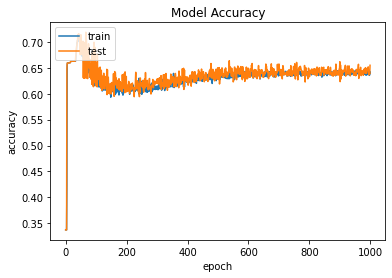

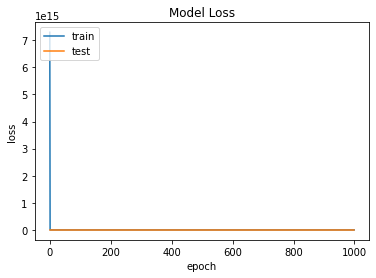

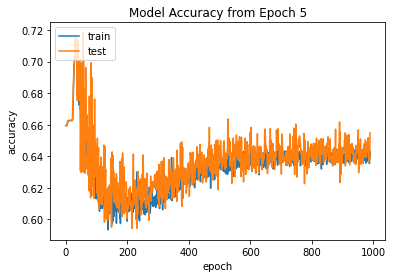

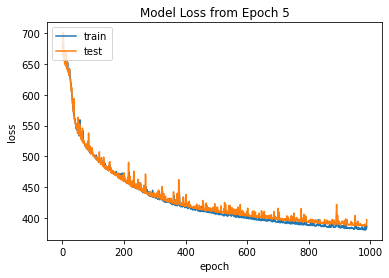

Number of labels: 5


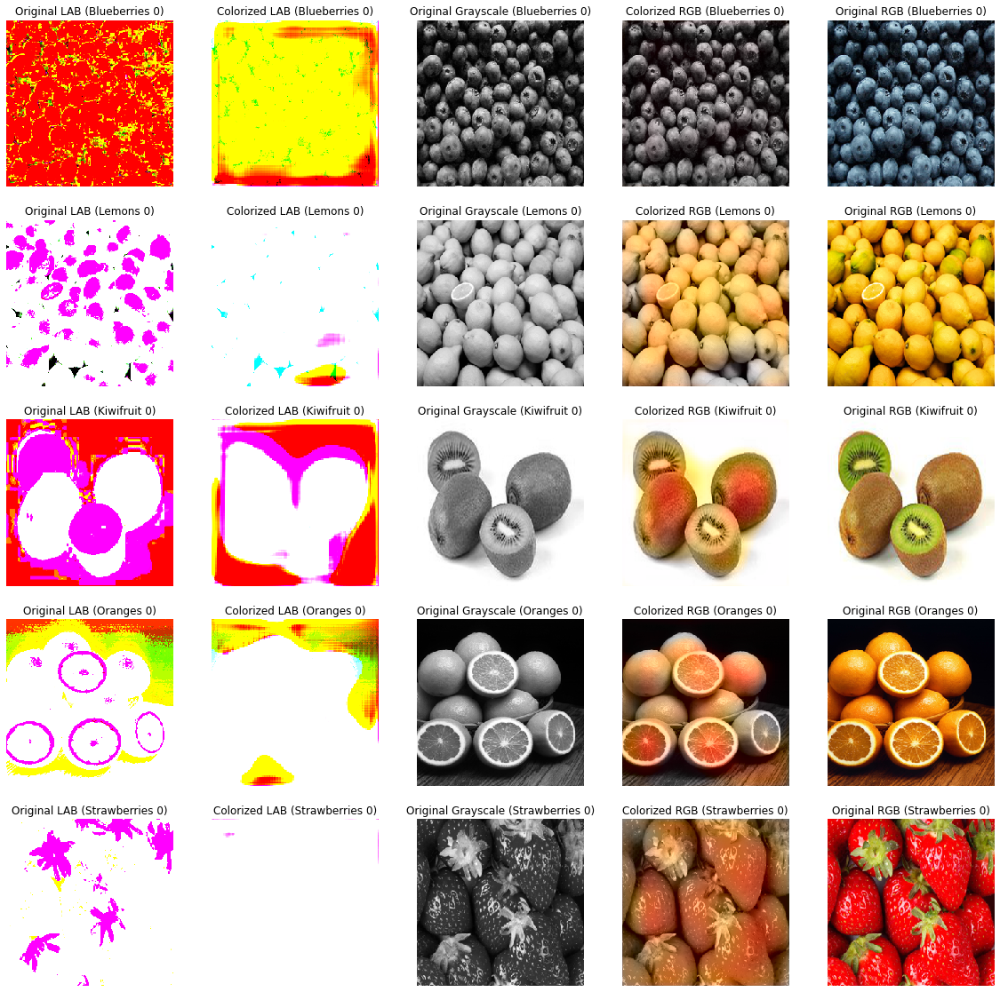

In [ ]:
def training10():
  # Parameters
  labelsToInclude = ['blueberries', 'lemons', 'oranges', 'kiwifruit', 'strawberries']
  modelName = 'Model B (5 Fruits 2nd Set) (1000 Epochs) (0.005 lr) (Data Augmented)'
  modelChoice = 'modelB'   # Currently have modelA, modelB, and modelC
  epochs = 1000
  learningRate = 0.005
  decay = 0.9
  lossChoice = 'mse'    # Currently only have 'mse'

  data = Data(labelsToInclude=labelsToInclude, testSize=categoryTestSize)
  data.loadImages()

  #### Augmentation Parameters ####
  dataset_multiply = 10
  featurewise_center = True
  rotation_range = 30
  zoom_range = 0.3
  horizontal_flip = True
  data.dataAugmentation(dataset_multiply=dataset_multiply, featurewise_center=featurewise_center, rotation_range=rotation_range, zoom_range=zoom_range, horizontal_flip=horizontal_flip)

  data.processTrainingData()
  data.processTestData()

  colorizationModel = ColorizationModel(modelName, modelChoice=modelChoice, learningRate=learningRate, decay=decay, lossChoice=lossChoice)
  colorizationModel.train(data.x_train, data.y_train, epochs)
  model = colorizationModel.model
  history = colorizationModel.history

  ### Evaluation ###
  evaluation = Evaluation()

  dataStart = 0
  numOfData = categoryTestSize
  evaluation.evaluateMetrics(data, model, dataStart, numOfData)

  evaluation.showAccuracyAndLoss(history, 'Model Accuracy', 'Model Loss', 'Model Accuracy from Epoch 5', 'Model Loss from Epoch 5', 10)

  evaluation.showAllImages(data, model, dataStart, 1)

  return data, model, evaluation

trainData10, trainModel10, trainEvaluation10 = training10()

Value range:
  L  : [3.083526611328125, 100.0]
  AB : [0.0, 64.96673583984375]
  LAB: [0.0, 100.0]
  RGB: [0.0, 1.0]



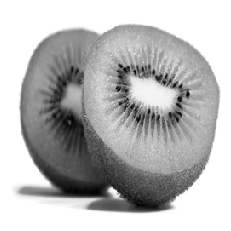

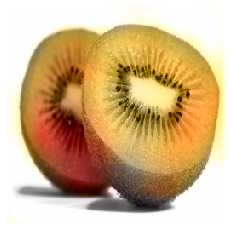

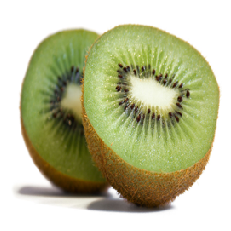

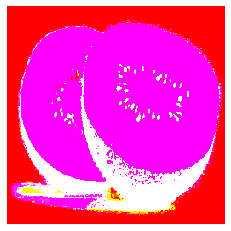

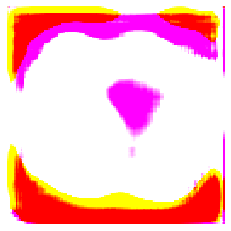


Originial LAB Image 0 to 1


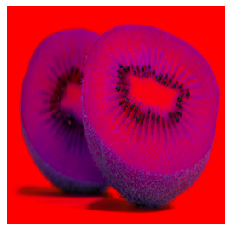


Predicted LAB Image 0 to 1


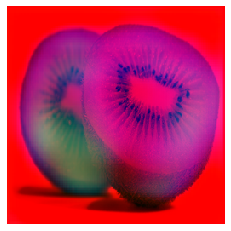


Predicted LAB 3D Graph
(256, 256, 3)


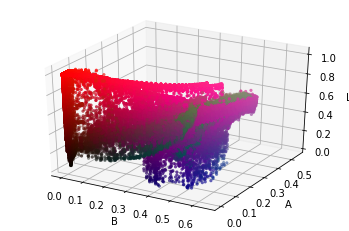

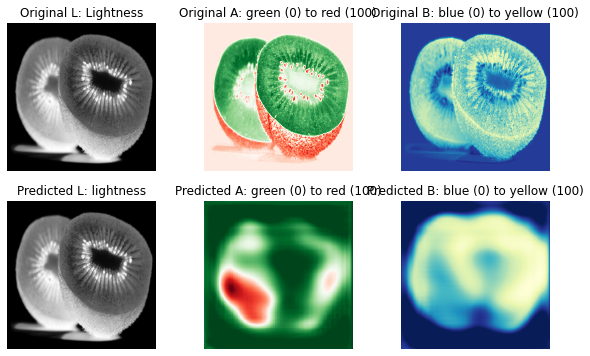

In [ ]:
  trainEvaluation10.showOneImageInfo(1, 'kiwifruit', trainData10, trainModel10)

In [ ]:
trainData10.lab_org_test['blueberries'][:][:][2].max()


100.0

## Training 11: (Model B, (5 Fruits 3rd Set Blue), 1000 Epochs, Data Augmentation

Loading image paths...

Data paths loaded!
     Number of data: 148

Loading images from paths...

Images Loaded!
     Shape  of training data: (133, 256, 256, 3)
     Number of test data:
       avocados  : 3
       blueberries: 3
       limes     : 3
       grapes    : 3
       olives    : 3
Augmented data shape: (1330, 256, 256, 3)
Training Shape:
  Training Input  Images in L Space   : (1330, 256, 256, 1)
  Training Output Images in AB Space  : (1330, 256, 256, 2)

Testing Shape (category: avocados):
  Resized Test Image in RGB  Space   : (3, 256, 256, 3)
  Resized Test Image in gray Space   : (3, 256, 256)
  Resized Test Image in LAB  Space   : (3, 256, 256, 3)
  Resized Test Image in L    Space   : (3, 256, 256, 1)

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_15 (Conv2D)          (None, 128, 128, 64)      640       
                                                


WAIT! Saving Model...

Training Finished
   Model Log saved in      : /content/drive/MyDrive/COMP3362_Proj/ModelLog (Alex)/11-12 17:39:31 Model B (5 Fruits 3rd Set Blue) (1000 Epochs) (0.005 lr) (Data Augmented)
   Trained Model saved in  : /content/drive/MyDrive/COMP3362_Proj/TrainedModel (Alex)/11-12 17:39:31 Model B (5 Fruits 3rd Set Blue) (1000 Epochs) (0.005 lr) (Data Augmented)
avocados  (00) ------PSNR = 23.190423, SSIM = 0.959793, UIQM = -0.699218, UCIQE = 34.186418------
blueberries(00) ------PSNR = 24.681224, SSIM = 0.964304, UIQM = -0.513331, UCIQE = 22.920654------
limes     (00) ------PSNR = 16.216965, SSIM = 0.729703, UIQM = -0.786835, UCIQE = 27.347618------
grapes    (00) ------PSNR = 22.468563, SSIM = 0.935620, UIQM = -0.472204, UCIQE = 27.274503------
olives    (00) ------PSNR = 21.924617, SSIM = 0.874572, UIQM = -0.883389, UCIQE = 31.101719------
avocados  (01) ------PSNR = 21.963783, SSIM = 0.930422, UIQM = -0.608253, UCIQE = 33.649587------
blueberries(01) ------P

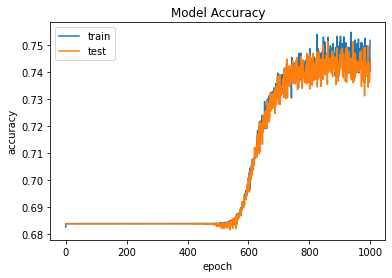

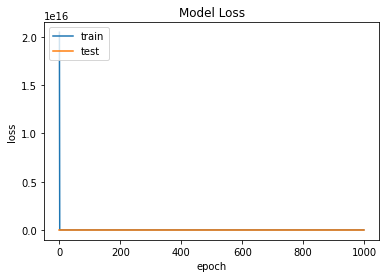

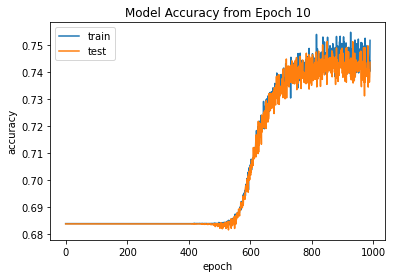

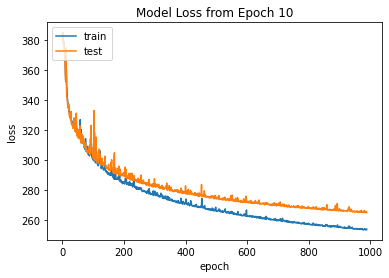

Number of labels: 5


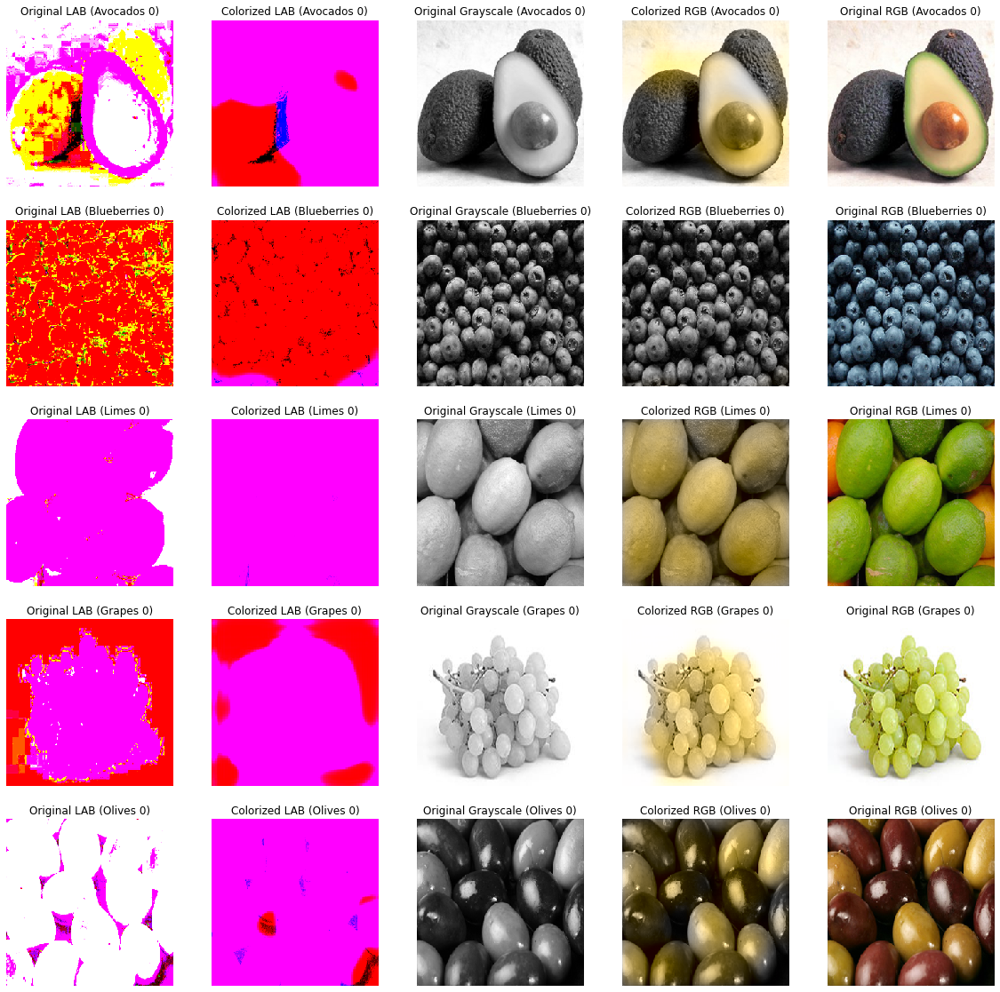

In [ ]:
def training11():
  # Parameters
  labelsToInclude = ['avocados', 'blueberries', 'grapes', 'limes', 'olives']
  modelName = 'Model B (5 Fruits 3rd Set Blue) (1000 Epochs) (0.005 lr) (Data Augmented)'
  modelChoice = 'modelB'   # Currently have modelA, modelB, and modelC
  epochs = 1000
  learningRate = 0.005
  decay = 0.9
  lossChoice = 'mse'    # Currently only have 'mse'

  data = Data(labelsToInclude=labelsToInclude, testSize=categoryTestSize)
  data.loadImages()

  #### Augmentation Parameters ####
  dataset_multiply = 10
  featurewise_center = True
  rotation_range = 30
  zoom_range = 0.3
  horizontal_flip = True
  data.dataAugmentation(dataset_multiply=dataset_multiply, featurewise_center=featurewise_center, rotation_range=rotation_range, zoom_range=zoom_range, horizontal_flip=horizontal_flip)

  data.processTrainingData()
  data.processTestData()

  colorizationModel = ColorizationModel(modelName, modelChoice=modelChoice, learningRate=learningRate, decay=decay, lossChoice=lossChoice)
  colorizationModel.train(data.x_train, data.y_train, epochs)
  model = colorizationModel.model
  history = colorizationModel.history

  ### Evaluation ###
  evaluation = Evaluation()

  dataStart = 0
  numOfData = categoryTestSize
  evaluation.evaluateMetrics(data, model, dataStart, numOfData)

  evaluation.showAccuracyAndLoss(history, 'Model Accuracy', 'Model Loss', 'Model Accuracy from Epoch 10', 'Model Loss from Epoch 10', 10)

  evaluation.showAllImages(data, model, dataStart, 1)

  return data, model, evaluation

trainData11, trainModel11, trainEvaluation11 = training11()

Value range:
  L  : [6.809453964233398, 100.0]
  AB : [0.0, 55.58994674682617]
  LAB: [0.0, 100.0]
  RGB: [0.0, 1.0]



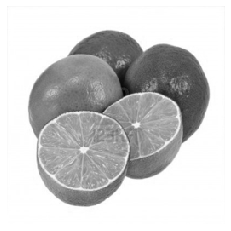

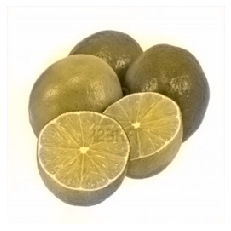

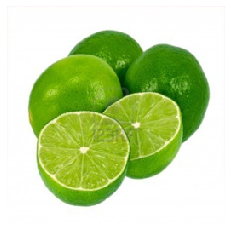

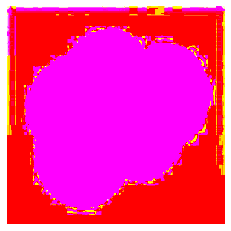

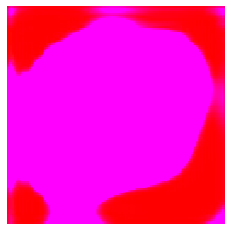


Originial LAB Image 0 to 1


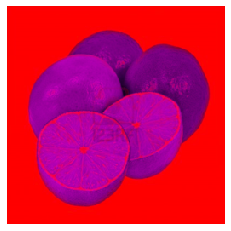


Predicted LAB Image 0 to 1


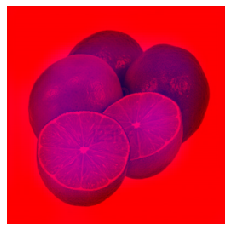


Predicted LAB 3D Graph
(256, 256, 3)


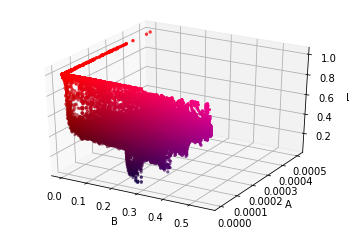

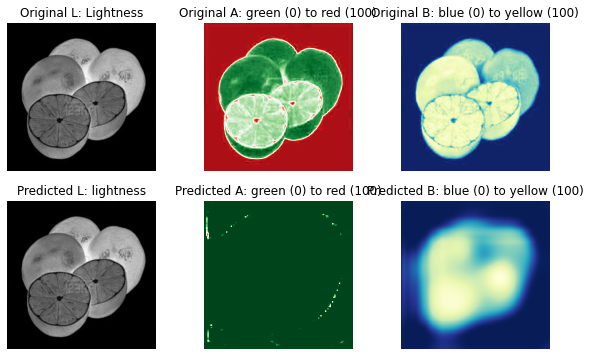

In [ ]:
  trainEvaluation11.showOneImageInfo(1, 'limes', trainData11, trainModel11)

## Finding why green and blue is not being colored

Loading image paths...

Data paths loaded!
     Number of data: 160

Loading images from paths...

Images Loaded!
     Shape  of training data: (142, 256, 256, 3)
     Number of test data:
       bananas   : 3
       avocados  : 3
       acerolas  : 3
       apples    : 3
       apricots  : 3
Training Shape:
  Training Input  Images in L Space   : (142, 256, 256, 1)
  Training Output Images in AB Space  : (142, 256, 256, 2)

Testing Shape (category: bananas):
  Resized Test Image in RGB  Space   : (3, 256, 256, 3)
  Resized Test Image in gray Space   : (3, 256, 256)
  Resized Test Image in LAB  Space   : (3, 256, 256, 3)
  Resized Test Image in L    Space   : (3, 256, 256, 1)

bananas   (00) ------PSNR = 16.549793, SSIM = 0.720587, UIQM = -0.830954, UCIQE = 33.013438------
avocados  (00) ------PSNR = 21.688286, SSIM = 0.930641, UIQM = -0.717380, UCIQE = 36.206458------
acerolas  (00) ------PSNR = 23.015628, SSIM = 0.932317, UIQM = -0.471545, UCIQE = 33.052506------
apples    (00) -----

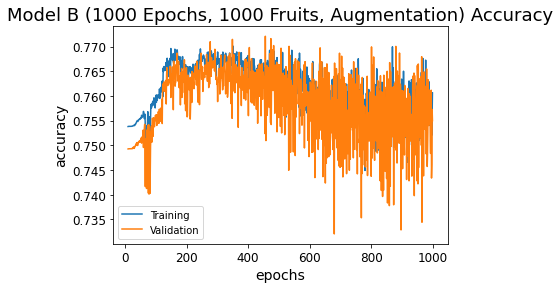

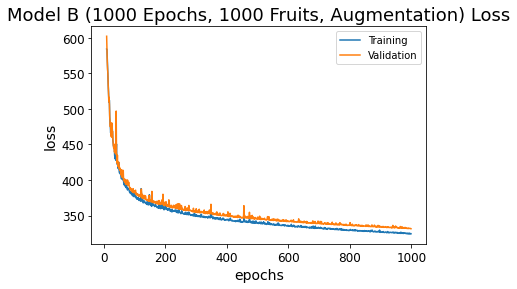

Number of labels: 5


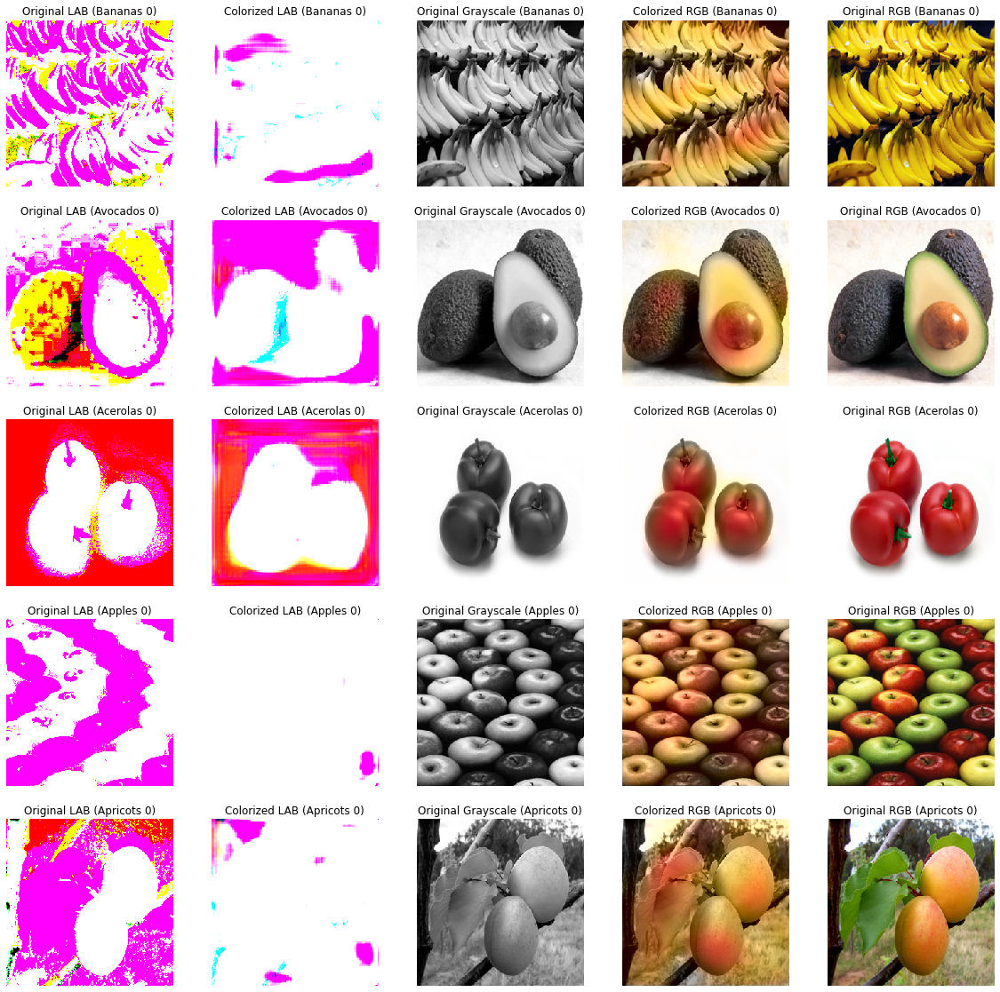

X Y Value Range:
 x_train: [0.0, 100.0]
 y_train: [-71.3378134884117, 93.90017393826548]
 lab_org: [-46.801597595214844, 100.0]

Predicted value range:
  L  : [0.09893417358398438, 100.0]
  AB : [0.0, 68.67929077148438]
  LAB: [0.0, 100.0]
  RGB: [0.0, 1.0]
Original value range:
  LAB: [-46.801597595214844, 100.0]
  RGB: [0.0, 1.0]
  Gry: [0.0014137255493551493, 0.9999999403953552]



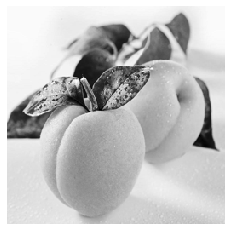

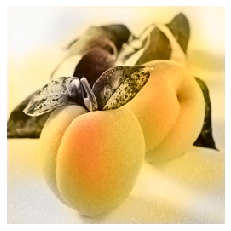

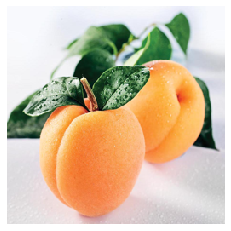

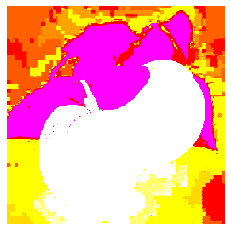

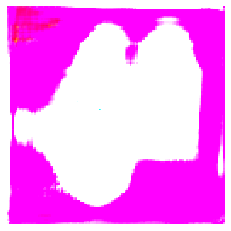


Originial LAB Image 0 to 1


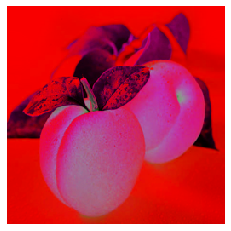


Predicted LAB Image 0 to 1


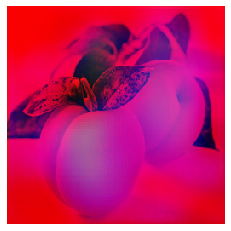


Predicted LAB 3D Graph
(256, 256, 3)


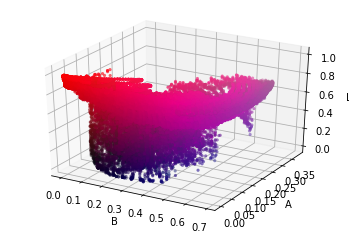

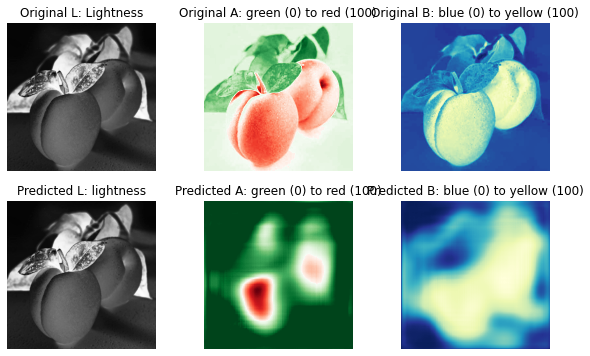

In [ ]:
# Prepare Data
labelsToInclude = ['acerolas', 'apples', 'apricots', 'avocados', 'bananas']
data5Fruits = Data(labelsToInclude=labelsToInclude, testSize=categoryTestSize)
data5Fruits.loadImages()
data5Fruits.processTrainingData()
data5Fruits.processTestData()

def experiment9_1(data):
  # Change!!!
  modelName = '11-06 02:03:54 Model B (5 Fruits) (1000 Epochs) (0.005 lr) (Data Augmented)'
  trainName = 'events.out.tfevents.1667671435.cdd5c3d70e63.105.8.v2'
  validName = 'events.out.tfevents.1667671439.cdd5c3d70e63.105.9.v2'
  accuracyTitle = 'Model B (1000 Epochs, 1000 Fruits, Augmentation) Accuracy'
  lossTitle = 'Model B (1000 Epochs, 1000 Fruits, Augmentation) Loss'
  accuracyLossStart = 10

  # Load Model
  modelToLoad = pwd + 'TrainedModel (Alex)/' + modelName
  model = tf.keras.models.load_model(modelToLoad)

  # ### Evaluation ###
  evaluation = Evaluation()

  dataStart = 0
  numOfData = categoryTestSize
  evaluation.evaluateMetrics(data, model, dataStart, numOfData)

  evaluation.showAccuracyAndLossLoad(modelName, trainName, validName, accuracyTitle, lossTitle, start=accuracyLossStart)


  evaluation.showAllImages(data, model, dataStart, 1)

  evaluation.showOneImageInfo(1, 'apricots', data, model)

  return evaluation, model

evaluation9, model9 = experiment9_1(data5Fruits)

## Training 12: (Model D, (5 Fruits 2nd Set), No Data Augmentation, 1000 Epochs)

Loading image paths...

Data paths loaded!
     Number of data: 178

Loading images from paths...

Images Loaded!
     Shape  of training data: (163, 256, 256, 3)
     Number of test data:
       blueberries: 3
       lemons    : 3
       kiwifruit : 3
       oranges   : 3
       strawberries: 3
Training Shape:
  Training Input  Images in L Space   : (163, 256, 256, 1)
  Training Output Images in AB Space  : (163, 256, 256, 2)

Testing Shape (category: blueberries):
  Resized Test Image in RGB  Space   : (3, 256, 256, 3)
  Resized Test Image in gray Space   : (3, 256, 256)
  Resized Test Image in LAB  Space   : (3, 256, 256, 3)
  Resized Test Image in L    Space   : (3, 256, 256, 1)

Model: "sequential_12"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_156 (Conv2D)         (None, 128, 128, 64)      640       
                                                                 
 conv2d_157 (Conv2D)


WAIT! Saving Model...

Training Finished
   Model Log saved in      : /content/drive/MyDrive/COMP3362_Proj/ModelLog (Alex)/11-13 02:05:15 Model D (5 Fruits 2nd Set) (1000 Epochs) (0.001 lr)
   Trained Model saved in  : /content/drive/MyDrive/COMP3362_Proj/TrainedModel (Alex)/11-13 02:05:15 Model D (5 Fruits 2nd Set) (1000 Epochs) (0.001 lr)
blueberries(00) ------PSNR = 24.995333, SSIM = 0.930363, UIQM = -0.565014, UCIQE = 26.376523------
lemons    (00) ------PSNR = 12.874933, SSIM = 0.714201, UIQM = -0.722090, UCIQE = 32.929696------
kiwifruit (00) ------PSNR = 22.225948, SSIM = 0.923138, UIQM = -0.607621, UCIQE = 30.984734------
oranges   (00) ------PSNR = 16.214202, SSIM = 0.695837, UIQM = -0.905246, UCIQE = 36.785889------
strawberries(00) ------PSNR = 12.059979, SSIM = 0.492734, UIQM = -0.985394, UCIQE = 28.606800------
blueberries(01) ------PSNR = 21.711099, SSIM = 0.945271, UIQM = -0.752091, UCIQE = 25.549919------
lemons    (01) ------PSNR = 17.749294, SSIM = 0.865723, UIQM = -

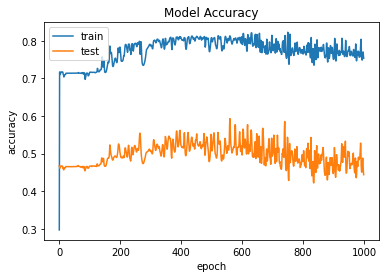

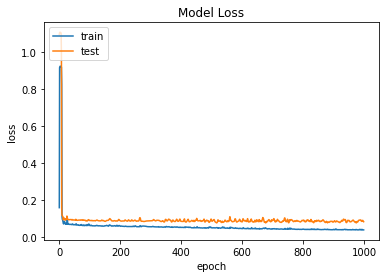

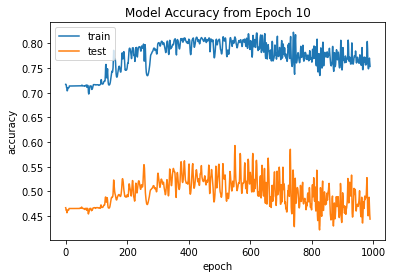

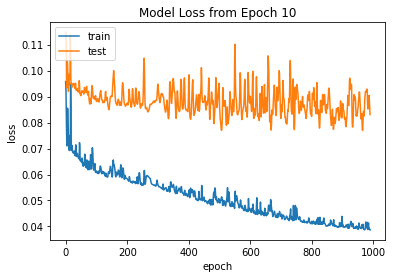

Number of labels: 5


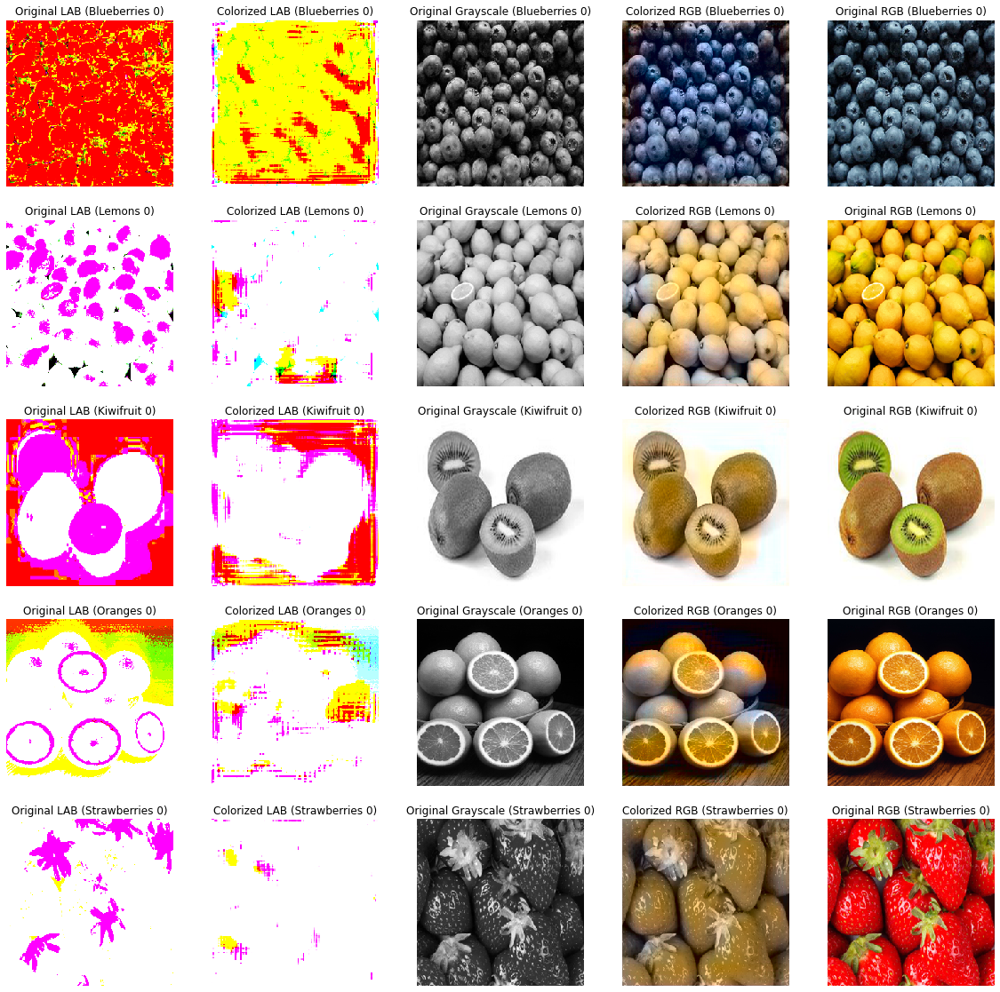

In [ ]:
def training12():
  # Parameters
  labelsToInclude = ['blueberries', 'lemons', 'oranges', 'kiwifruit', 'strawberries']
  modelName = 'Model D (5 Fruits 2nd Set) (1000 Epochs) (0.001 lr)'
  modelChoice = 'modelD'   # Currently have modelA, modelB, modelC, and modelD
  epochs = 1000
  learningRate = 0.001
  decay = 0.05
  lossChoice = 'mse'    # Currently only have 'mse'
  batchSize = 128

  data = Data(labelsToInclude=labelsToInclude, testSize=categoryTestSize)
  data.loadImages()

  #### Augmentation Parameters ####
  # dataset_multiply = 10
  # rotation_range = 30
  # zoom_range = 0.3
  # horizontal_flip = True
  # data.dataAugmentation(dataset_multiply=dataset_multiply, rotation_range=rotation_range, zoom_range=zoom_range, horizontal_flip=horizontal_flip)

  data.processTrainingData()
  data.processTestData()

  colorizationModel = ColorizationModel(modelName, modelChoice=modelChoice, learningRate=learningRate, decay=decay, lossChoice=lossChoice)
  colorizationModel.train(data.x_train, data.y_train, epochs, batch_size=batchSize)
  model = colorizationModel.model
  history = colorizationModel.history

  ### Evaluation ###
  evaluation = Evaluation()

  dataStart = 0
  numOfData = categoryTestSize
  evaluation.evaluateMetrics(data, model, dataStart, numOfData)

  evaluation.showAccuracyAndLoss(history, 'Model Accuracy', 'Model Loss', 'Model Accuracy from Epoch 10', 'Model Loss from Epoch 10', 10)

  evaluation.showAllImages(data, model, dataStart, 1)

  return data, model, evaluation

trainData12, trainModel12, trainEvaluation12 = training12()

## Training 14: (Model D, (5 Fruits 2nd Set), Data Augmentation B, 1000 Epochs)

Loading image paths...

Data paths loaded!
     Number of data: 178

Loading images from paths...

Images Loaded!
     Shape  of training data: (163, 256, 256, 3)
     Number of test data:
       blueberries: 3
       lemons    : 3
       kiwifruit : 3
       oranges   : 3
       strawberries: 3
Augmented data shape: (1630, 256, 256, 3)
Training Shape:
  Training Input  Images in L Space   : (1630, 256, 256, 1)
  Training Output Images in AB Space  : (1630, 256, 256, 2)

Testing Shape (category: blueberries):
  Resized Test Image in RGB  Space   : (3, 256, 256, 3)
  Resized Test Image in gray Space   : (3, 256, 256)
  Resized Test Image in LAB  Space   : (3, 256, 256, 3)
  Resized Test Image in L    Space   : (3, 256, 256, 1)

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 128, 128, 64)      640       
                                             


WAIT! Saving Model...

Training Finished
   Model Log saved in      : /content/drive/MyDrive/COMP3362_Proj/ModelLog (Alex)/11-13 11:46:59 Model D (5 Fruits 2nd Set) (Data Augmented B) (1000 Epochs) (0.001 lr)
   Trained Model saved in  : /content/drive/MyDrive/COMP3362_Proj/TrainedModel (Alex)/11-13 11:46:59 Model D (5 Fruits 2nd Set) (Data Augmented B) (1000 Epochs) (0.001 lr)
blueberries(00) ------PSNR = 25.248869, SSIM = 0.926459, UIQM = -0.567671, UCIQE = 26.289166------
lemons    (00) ------PSNR = 14.881884, SSIM = 0.713220, UIQM = -0.729436, UCIQE = 34.343702------
kiwifruit (00) ------PSNR = 23.680057, SSIM = 0.939898, UIQM = -0.612533, UCIQE = 32.369340------
oranges   (00) ------PSNR = 18.541453, SSIM = 0.752845, UIQM = -0.909601, UCIQE = 37.800711------
strawberries(00) ------PSNR = 15.859644, SSIM = 0.573851, UIQM = -0.991153, UCIQE = 31.591205------
blueberries(01) ------PSNR = 17.989528, SSIM = 0.890845, UIQM = -0.749502, UCIQE = 27.076672------
lemons    (01) ------PSNR 

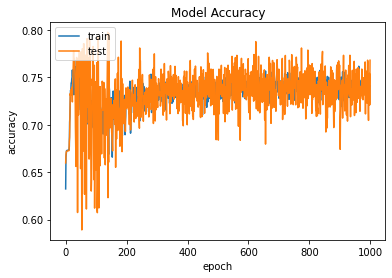

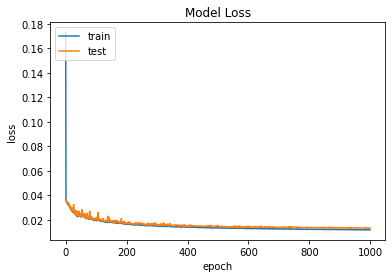

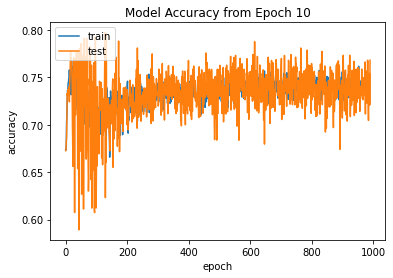

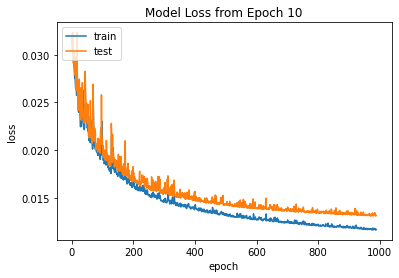

Number of labels: 5


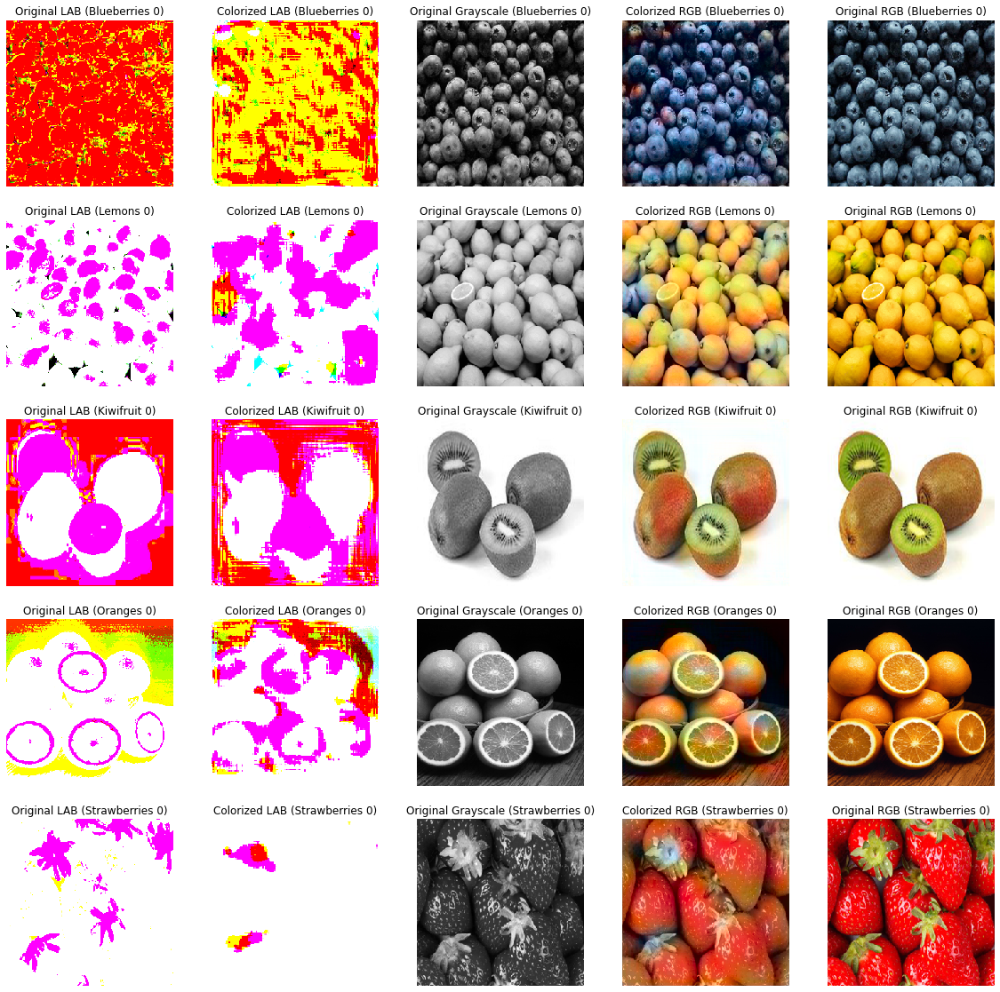

In [ ]:
def training14():
  # Parameters
  labelsToInclude = ['blueberries', 'lemons', 'oranges', 'kiwifruit', 'strawberries']
  modelName = 'Model D (5 Fruits 2nd Set) (Data Augmented B) (1000 Epochs) (0.001 lr)'
  modelChoice = 'modelD'   # Currently have modelA, modelB, modelC, and modelD
  epochs = 1000
  learningRate = 0.001
  decay = 0.05
  lossChoice = 'mse'    # Currently only have 'mse'
  batchSize = 128

  data = Data(labelsToInclude=labelsToInclude, testSize=categoryTestSize)
  data.loadImages()

  #### Augmentation Parameters ####
  dataset_multiply = 10
  rotation_range = 30
  zoom_range = 0.3
  horizontal_flip = True
  width_shift_range=0.4
  height_shift_range=0.2
  brightness_range=[0.3,0.9]
  shear_range=20
  data.dataAugmentation(dataset_multiply=dataset_multiply,
                        rotation_range=rotation_range,
                        zoom_range=zoom_range,
                        horizontal_flip=horizontal_flip,
                        width_shift_range=width_shift_range,
                        height_shift_range=height_shift_range,
                        brightness_range=brightness_range,
                        shear_range=shear_range)

  data.processTrainingData()
  data.processTestData()

  colorizationModel = ColorizationModel(modelName, modelChoice=modelChoice, learningRate=learningRate, decay=decay, lossChoice=lossChoice)
  colorizationModel.train(data.x_train, data.y_train, epochs, batch_size=batchSize)
  model = colorizationModel.model
  history = colorizationModel.history

  ### Evaluation ###
  evaluation = Evaluation()

  dataStart = 0
  numOfData = categoryTestSize
  evaluation.evaluateMetrics(data, model, dataStart, numOfData)

  evaluation.showAccuracyAndLoss(history, 'Model Accuracy', 'Model Loss', 'Model Accuracy from Epoch 10', 'Model Loss from Epoch 10', 10)

  evaluation.showAllImages(data, model, dataStart, 1)

  return data, model, evaluation

trainData14, trainModel14, trainEvaluation14 = training14()

## Training 17: (Model D, (5 Fruits 2nd Set), Data Augmentation A, 1000 Epochs, with noisy background data)

Loading image paths...

Data paths loaded!
     Number of data: 225

Loading images from paths...

Images Loaded!
     Shape  of training data: (188, 256, 256, 3)
     Number of test data:
       blueberries: 3
       blueberries_background: 3
       lemons    : 3
       lemons_background: 3
       kiwifruit : 3
       kiwifruit_background: 3
       oranges   : 3
       oranges_background: 3
       strawberries: 3
       strawberries_background: 3
       mixed     : 5
Augmented data shape: (1880, 256, 256, 3)
Training Shape:
  Training Input  Images in L Space   : (1880, 256, 256, 1)
  Training Output Images in AB Space  : (1880, 256, 256, 2)

Testing Shape (category: blueberries):
  Resized Test Image in RGB  Space   : (3, 256, 256, 3)
  Resized Test Image in gray Space   : (3, 256, 256)
  Resized Test Image in LAB  Space   : (3, 256, 256, 3)
  Resized Test Image in L    Space   : (3, 256, 256, 1)

Model: "sequential_1"
_________________________________________________________________


WAIT! Saving Model...

Training Finished
   Model Log saved in      : /content/drive/MyDrive/COMP3362_Proj/ModelLog (Alex)/11-20 03:01:15 Model D (5 Fruits 2nd Set) (Data Augmented A) (1000 Epochs) (0.001 lr) (With Noisy Background)
   Trained Model saved in  : /content/drive/MyDrive/COMP3362_Proj/TrainedModel (Alex)/11-20 03:01:15 Model D (5 Fruits 2nd Set) (Data Augmented A) (1000 Epochs) (0.001 lr) (With Noisy Background)
blueberries(00) ------PSNR = 24.861834, SSIM = 0.966002, UIQM = -0.512897, UCIQE = 22.668475------
blueberries_background(00) ------PSNR = 20.344052, SSIM = 0.936731, UIQM = -0.810307, UCIQE = 23.273448------
lemons    (00) ------PSNR = 9.087782, SSIM = 0.687140, UIQM = -0.714328, UCIQE = 25.929696------
lemons_background(00) ------PSNR = 11.853082, SSIM = 0.716487, UIQM = -0.821224, UCIQE = 23.837734------
kiwifruit (00) ------PSNR = 17.044671, SSIM = 0.916208, UIQM = -0.593861, UCIQE = 22.489206------
kiwifruit_background(00) ------PSNR = 14.189899, SSIM = 0.851

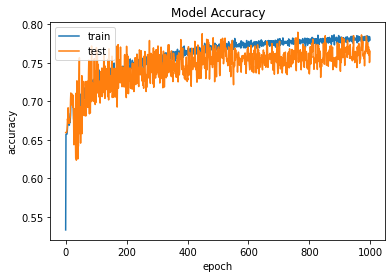

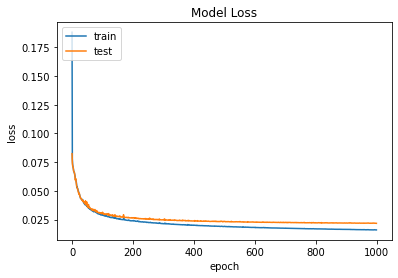

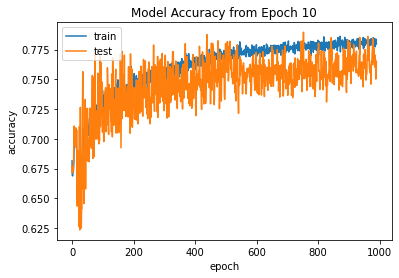

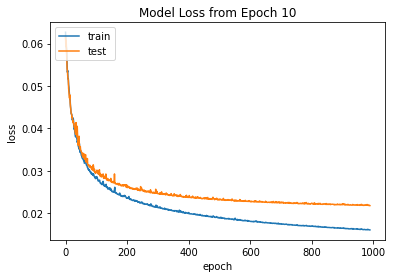

Number of labels: 11


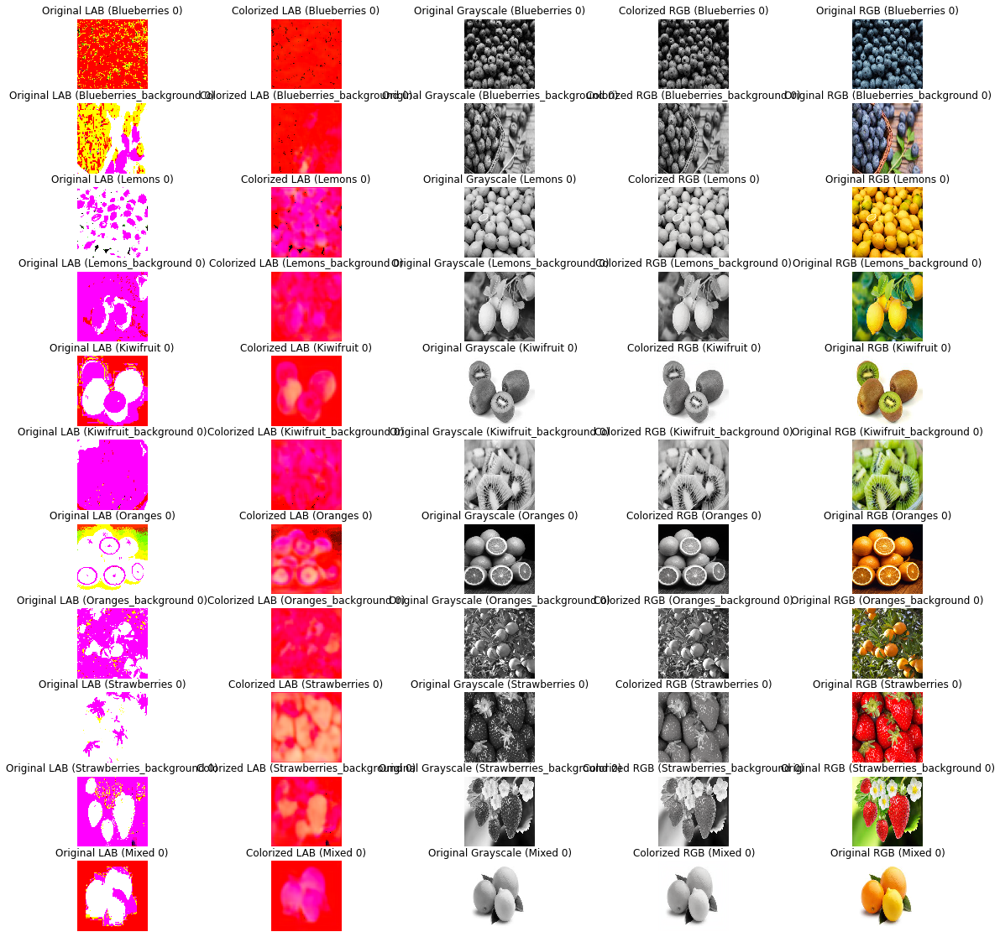

In [ ]:
def training17():
  # Parameters
  labelsToInclude = ['blueberries', 'lemons', 'oranges', 'kiwifruit', 'strawberries']
  modelName = 'Model D (5 Fruits 2nd Set) (Data Augmented A) (1000 Epochs) (0.001 lr) (With Noisy Background)'
  modelChoice = 'modelD'   # Currently have modelA, modelB, modelC, and modelD
  epochs = 1000
  learningRate = 0.001
  decay = 0.05
  lossChoice = 'mse'    # Currently only have 'mse'
  batchSize = 128
  includeNoisyBgForTrain = True

  data = Data(labelsToInclude=labelsToInclude, testSize=categoryTestSize, includeNoisyBgForTrain=includeNoisyBgForTrain)
  data.loadImages()

  #### Augmentation Parameters ####
  dataset_multiply = 10
  rotation_range = 30
  zoom_range = 0.3
  horizontal_flip = True
  data.dataAugmentation(dataset_multiply=dataset_multiply, rotation_range=rotation_range, zoom_range=zoom_range, horizontal_flip=horizontal_flip)

  data.processTrainingData()
  data.processTestData()

  colorizationModel = ColorizationModel(modelName, modelChoice=modelChoice, learningRate=learningRate, decay=decay, lossChoice=lossChoice)
  colorizationModel.train(data.x_train, data.y_train, epochs, batch_size=batchSize)
  model = colorizationModel.model
  history = colorizationModel.history

  ### Evaluation ###
  evaluation = Evaluation()

  dataStart = 0
  numOfData = categoryTestSize
  evaluation.evaluateMetrics(data, model, dataStart, numOfData)

  evaluation.showAccuracyAndLoss(history, 'Model Accuracy', 'Model Loss', 'Model Accuracy from Epoch 10', 'Model Loss from Epoch 10', 10)

  evaluation.showAllImages(data, model, dataStart, 1)

  return data, model, evaluation

trainData17, trainModel17, trainEvaluation17 = training17()

## Training 13: (Model D, (5 Fruits 2nd Set), Data Augmentation A, 1000 Epochs)

Loading image paths...

Data paths loaded!
     Number of data: 178

Loading images from paths...

Images Loaded!
     Shape  of training data: (163, 256, 256, 3)
     Number of test data:
       blueberries: 3
       lemons    : 3
       kiwifruit : 3
       oranges   : 3
       strawberries: 3
Augmented data shape: (1630, 256, 256, 3)
Training Shape:
  Training Input  Images in L Space   : (1630, 256, 256, 1)
  Training Output Images in AB Space  : (1630, 256, 256, 2)

Testing Shape (category: blueberries):
  Resized Test Image in RGB  Space   : (3, 256, 256, 3)
  Resized Test Image in gray Space   : (3, 256, 256)
  Resized Test Image in LAB  Space   : (3, 256, 256, 3)
  Resized Test Image in L    Space   : (3, 256, 256, 1)

Model: "sequential_11"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_143 (Conv2D)         (None, 128, 128, 64)      640       
                                          


WAIT! Saving Model...

Training Finished
   Model Log saved in      : /content/drive/MyDrive/COMP3362_Proj/ModelLog (Alex)/11-13 01:24:46 Model D (5 Fruits 2nd Set) (Data Augmented) (1000 Epochs) (0.001 lr)
   Trained Model saved in  : /content/drive/MyDrive/COMP3362_Proj/TrainedModel (Alex)/11-13 01:24:46 Model D (5 Fruits 2nd Set) (Data Augmented) (1000 Epochs) (0.001 lr)
blueberries(00) ------PSNR = 23.970437, SSIM = 0.932686, UIQM = -0.585456, UCIQE = 27.561726------
lemons    (00) ------PSNR = 13.943248, SSIM = 0.709206, UIQM = -0.731570, UCIQE = 35.912774------
kiwifruit (00) ------PSNR = 23.275580, SSIM = 0.942871, UIQM = -0.608419, UCIQE = 33.490802------
oranges   (00) ------PSNR = 18.769238, SSIM = 0.769642, UIQM = -0.907392, UCIQE = 38.122967------
strawberries(00) ------PSNR = 17.035954, SSIM = 0.600985, UIQM = -0.999550, UCIQE = 32.896794------
blueberries(01) ------PSNR = 21.771289, SSIM = 0.930693, UIQM = -0.743319, UCIQE = 28.703740------
lemons    (01) ------PSNR = 21

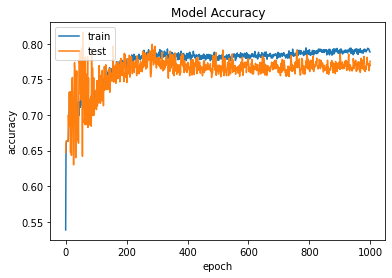

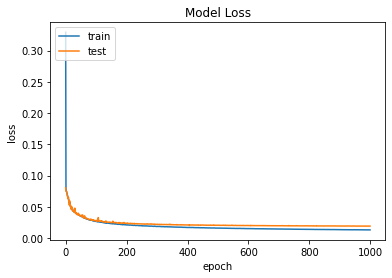

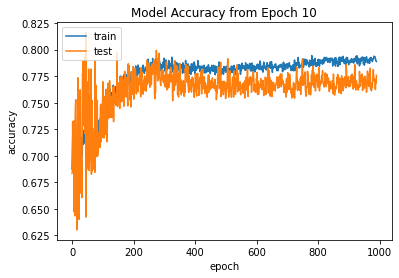

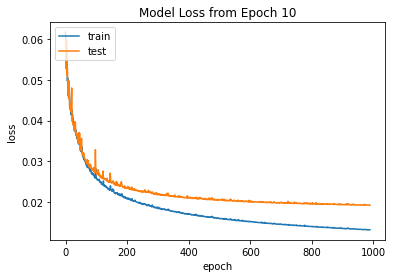

Number of labels: 5


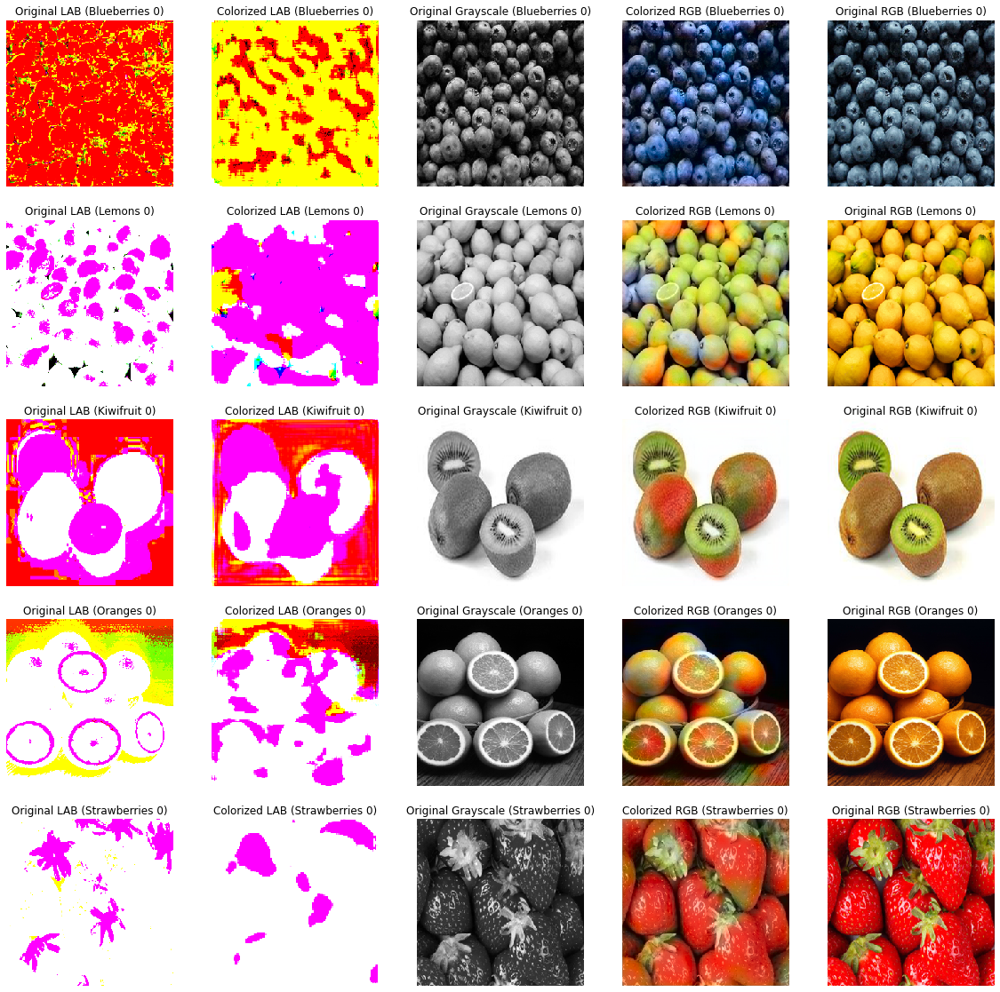

In [ ]:
def training13():
  # Parameters
  labelsToInclude = ['blueberries', 'lemons', 'oranges', 'kiwifruit', 'strawberries']
  modelName = 'Model D (5 Fruits 2nd Set) (Data Augmented) (1000 Epochs) (0.001 lr)'
  modelChoice = 'modelD'   # Currently have modelA, modelB, modelC, and modelD
  epochs = 1000
  learningRate = 0.001
  decay = 0.05
  lossChoice = 'mse'    # Currently only have 'mse'
  batchSize = 128

  data = Data(labelsToInclude=labelsToInclude, testSize=categoryTestSize)
  data.loadImages()

  #### Augmentation Parameters ####
  dataset_multiply = 10
  rotation_range = 30
  zoom_range = 0.3
  horizontal_flip = True
  data.dataAugmentation(dataset_multiply=dataset_multiply, rotation_range=rotation_range, zoom_range=zoom_range, horizontal_flip=horizontal_flip)

  data.processTrainingData()
  data.processTestData()

  colorizationModel = ColorizationModel(modelName, modelChoice=modelChoice, learningRate=learningRate, decay=decay, lossChoice=lossChoice)
  colorizationModel.train(data.x_train, data.y_train, epochs, batch_size=batchSize)
  model = colorizationModel.model
  history = colorizationModel.history

  ### Evaluation ###
  evaluation = Evaluation()

  dataStart = 0
  numOfData = categoryTestSize
  evaluation.evaluateMetrics(data, model, dataStart, numOfData)

  evaluation.showAccuracyAndLoss(history, 'Model Accuracy', 'Model Loss', 'Model Accuracy from Epoch 10', 'Model Loss from Epoch 10', 10)

  evaluation.showAllImages(data, model, dataStart, 1)

  return data, model, evaluation

trainData13, trainModel13, trainEvaluation13 = training13()

## Training 18: (Model B Tanh, (All Fruits 2nd Set), Data Augmentation A, 3000 Epochs)

Streaming output truncated to the last 5000 lines.
35/35 [==============================] - 7s 200ms/step - loss: 0.0213 - accuracy: 0.7887 - val_loss: 0.0239 - val_accuracy: 0.7793
Epoch 502/3000
35/35 [==============================] - 7s 199ms/step - loss: 0.0213 - accuracy: 0.7887 - val_loss: 0.0239 - val_accuracy: 0.7839
Epoch 503/3000
35/35 [==============================] - 7s 200ms/step - loss: 0.0213 - accuracy: 0.7889 - val_loss: 0.0238 - val_accuracy: 0.7837
Epoch 504/3000
35/35 [==============================] - 7s 198ms/step - loss: 0.0212 - accuracy: 0.7890 - val_loss: 0.0238 - val_accuracy: 0.7784
Epoch 505/3000
35/35 [==============================] - 7s 198ms/step - loss: 0.0212 - accuracy: 0.7880 - val_loss: 0.0239 - val_accuracy: 0.7834
Epoch 506/3000
35/35 [==============================] - 7s 201ms/step - loss: 0.0212 - accuracy: 0.7899 - val_loss: 0.0238 - val_accuracy: 0.7810
Epoch 507/3000
35/35 [==============================] - 7s 200ms/step - loss: 0.0212 - a


WAIT! Saving Model...

Training Finished
   Model Log saved in      : /content/drive/MyDrive/COMP3362_Proj/ModelLog (Alex)/11-20 06:04:02 Model B Tanh (All Fruits 2nd Set) (Data Augmented) (2000 Epochs) (0.001 lr)
   Trained Model saved in  : /content/drive/MyDrive/COMP3362_Proj/TrainedModel (Alex)/11-20 06:04:02 Model B Tanh (All Fruits 2nd Set) (Data Augmented) (2000 Epochs) (0.001 lr)
bananas   (00) ------PSNR = 10.194103, SSIM = 0.690412, UIQM = -0.815153, UCIQE = 26.252008------
avocados  (00) ------PSNR = 21.862628, SSIM = 0.973636, UIQM = -0.692299, UCIQE = 27.490075------
acerolas  (00) ------PSNR = 17.184892, SSIM = 0.886408, UIQM = -0.443167, UCIQE = 22.984991------
apples    (00) ------PSNR = 14.363258, SSIM = 0.784694, UIQM = -0.933554, UCIQE = 25.325749------
apricots  (00) ------PSNR = 15.585079, SSIM = 0.835157, UIQM = -0.818108, UCIQE = 27.485394------
blackberries(00) ------PSNR = 18.250672, SSIM = 0.905098, UIQM = -0.786743, UCIQE = 25.528645------
blueberries(00) --

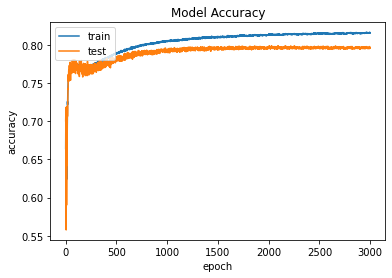

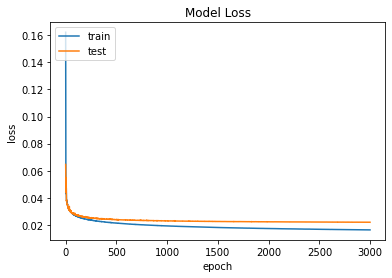

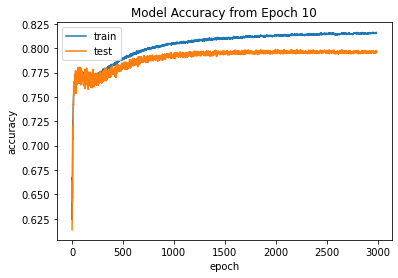

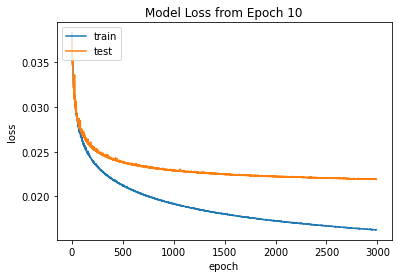

Number of labels: 21


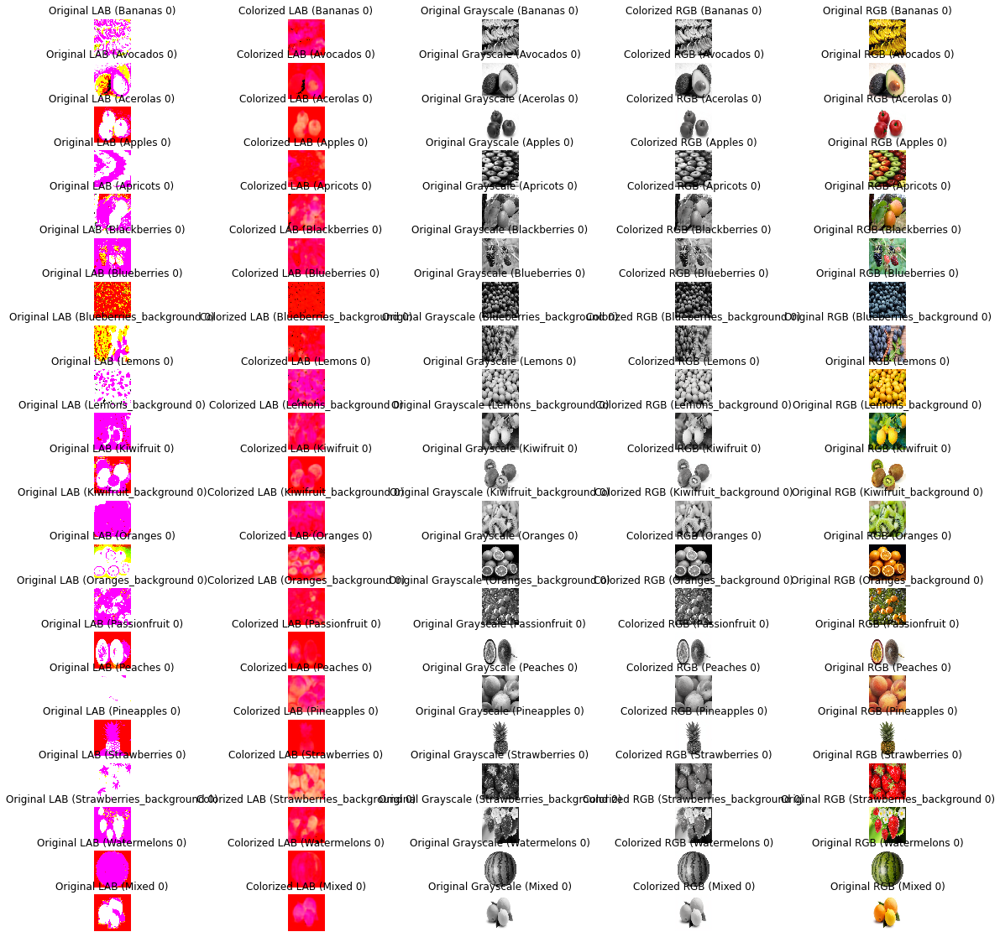

In [ ]:
def training18():
  # Parameters
  labelsToInclude = ['acerolas', 'apples', 'apricots', 'avocados', 'bananas',
                     'blueberries', 'lemons', 'oranges', 'kiwifruit', 'strawberries',
                     'blackberries', 'peaches', 'passionfruit', 'pineapples', 'watermelons']
  modelName = 'Model B Tanh (All Fruits 2nd Set) (Data Augmented) (2000 Epochs) (0.001 lr)'
  modelChoice = 'modelD'   # Currently have modelA, modelB, modelC, and modelD
  epochs = 3000
  learningRate = 0.001
  decay = 0.05
  lossChoice = 'mse'    # Currently only have 'mse'
  batchSize = 128

  data = Data(labelsToInclude=labelsToInclude, testSize=categoryTestSize)
  data.loadImages()

  #### Augmentation Parameters ####
  dataset_multiply = 10
  rotation_range = 30
  zoom_range = 0.3
  horizontal_flip = True
  data.dataAugmentation(dataset_multiply=dataset_multiply, rotation_range=rotation_range, zoom_range=zoom_range, horizontal_flip=horizontal_flip)

  data.processTrainingData()
  data.processTestData()

  colorizationModel = ColorizationModel(modelName, modelChoice=modelChoice, learningRate=learningRate, decay=decay, lossChoice=lossChoice)
  colorizationModel.train(data.x_train, data.y_train, epochs, batch_size=batchSize)
  model = colorizationModel.model
  history = colorizationModel.history

  ### Evaluation ###
  evaluation = Evaluation()

  dataStart = 0
  numOfData = categoryTestSize
  evaluation.evaluateMetrics(data, model, dataStart, numOfData)

  evaluation.showAccuracyAndLoss(history, 'Model Accuracy', 'Model Loss', 'Model Accuracy from Epoch 10', 'Model Loss from Epoch 10', 10)

  evaluation.showAllImages(data, model, dataStart, 1)

  return data, model, evaluation

trainData18, trainModel18, trainEvaluation18 = training18()